##  Gridded Model Verification

This script verifies output from a ML-based foundation model versus a
traditional NWP system for the atmospheric system. The defaults set at the top of
this script are tailored to the Alps-Clariden HPC system at CSCS.

**Enter all your user settings in the cell below.**

In [1]:
import random

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
from mllam_data_prep.ops.cropping import crop_with_convex_hull
from pysteps.verification.salscores import sal  # requires scikit-image
from scipy.stats import gaussian_kde, wasserstein_distance
from scores.categorical import BinaryContingencyManager
from scores.continuous import (
    mae,
    mse,
    rmse,
)
from scores.continuous.correlation import pearsonr
from scores.spatial import fss_2d

/users/sadamov/miniforge3/envs/neural-lam/lib/python3.12/site-packages/pyproj/network.py:59: UserWarning: pyproj unable to set PROJ database path.
  _set_context_ca_bundle_path(ca_bundle_path)


Pysteps configuration file found at: /users/sadamov/miniforge3/envs/neural-lam/lib/python3.12/site-packages/pysteps/pystepsrc



In [ ]:
ds = xr.open_dataset(
    "/iopsstor/scratch/cscs/sadamov/pyprojects_data/neural-lam/eval_results/train-hi_lam-2x300-02_09_09-9499_val.zarr"
)
ds.start_time

<xarray.DataArray 'start_time' (start_time: 7321)> Size: 59kB
array(['2019-10-30T14:00:00.000000000', '2019-10-31T14:00:00.000000000',
       '2019-11-01T14:00:00.000000000', ..., '2039-11-12T14:00:00.000000000',
       '2039-11-13T14:00:00.000000000', '2020-08-30T14:00:00.000000000'],
      shape=(7321,), dtype='datetime64[ns]')
Coordinates:
  * start_time  (start_time) datetime64[ns] 59kB 2019-10-30T14:00:00 ... 2020...

In [ ]:
ds = xr.open_dataset("/capstor/store/cscs/swissai/a01/sadamov/cosmo_e.zarr")
ds

<xarray.Dataset> Size: 895GB
Dimensions:             (y: 390, x: 582, lead_time: 121, time: 679)
Coordinates:
    lat                 (y, x) float64 2MB ...
  * lead_time           (lead_time) timedelta64[ns] 968B 00:00:00 ... 5 days ...
    lon                 (y, x) float64 2MB ...
  * time                (time) datetime64[ns] 5kB 2019-10-30 ... 2020-10-29
Dimensions without coordinates: y, x
Data variables:
    precipitation_1hr   (time, lead_time, y, x) float64 149GB ...
    pressure_sea_level  (time, lead_time, y, x) float64 149GB ...
    surface_pressure    (time, lead_time, y, x) float64 149GB ...
    temperature_2m      (time, lead_time, y, x) float64 149GB ...
    wind_u_10m          (time, lead_time, y, x) float64 149GB ...
    wind_v_10m          (time, lead_time, y, x) float64 149GB ...

In [21]:
### DEFAULTS ###
# This config will be applied to the data before any plotting. The data will be
# sliced and indexed according to the values in this config.

# Paths to the data (in zarr format!)
PATH_GROUND_TRUTH = "/capstor/store/cscs/swissai/a01/sadamov/cosmo_sample.zarr"
PATH_NWP = "/capstor/store/cscs/swissai/a01/sadamov/cosmo_sample.zarr"
PATH_ML = "/capstor/store/cscs/swissai/a01/sadamov/cosmo_sample.zarr"
PATH_BOUNDARY = "/capstor/store/cscs/swissai/a01/sadamov/era_subset.zarr"
# Temporal resolution in hours.
TEMPORAL_RESOLUTION = 1
# Selection of time steps (e.g. ["2021-01-01T06", "2021-01-05T00"], or [None,
# None])
DATETIMES = [
    "2016-01-01T00",
    "2016-01-10T00",
]  # Selection spatial grid in projection
X = [None, None]
Y = [None, None]
# Selection of vertical levels
Z = [6, 12, 20, 27, 31, 39, 45, 60]
# Map projection settings for plotting
PROJECTION = ccrs.RotatedPole(
    pole_longitude=190,
    pole_latitude=43,
    central_rotated_longitude=10,
)
PADDING_DEGREES = 3

# Variables to be plotted, 2D and 3D variables are treated separately
# Dims - 2D: time, latitude, longitude; 3D: time, latitude, longitude, level
VARIABLES_2D = [
    "T_2M",
    "U_10M",
    "V_10M",
    "PMSL",
    "PS",
    "TOT_PREC",
    "ASHFL_S",
    "ASOB_S",
    "ATHB_S",
]
VARIABLES_3D = ["U", "V", "PP", "T", "RELHUM", "W"]
# Variable mapping dictionary boundary/interior
var_mapping = {
    # Surface variables
    "U_10M": "10m_u_component_of_wind",
    "T_2M": "2m_temperature",
    "V_10M": "10m_v_component_of_wind",
    "PMSL": "mean_sea_level_pressure",
    "PS": "surface_pressure",
    "TOT_PREC": "total_precipitation",
    # Height level variables
    "U": "u_component_of_wind",
    "V": "v_component_of_wind",
    "T": "temperature",
    "RELHUM": "specific_humidity",
    "W": "vertical_velocity",
}
# For some plots a random time step sample is selected
RANDOM_SEED = 42
TIME_SUBSAMPLES = 10
DPI = 100

Loading ground truth data. The content must match the config defined in the first code cell.
The dimensions must match the dims from the zarr archive.

In [10]:
ds_gt = xr.open_zarr(PATH_GROUND_TRUTH)
ds_gt = ds_gt.sel(
    x=slice(*X),
    y=slice(*Y),
    z=Z,
    time=slice(*DATETIMES),
)
ds_gt = ds_gt[VARIABLES_2D + VARIABLES_3D]
ds_timestep = int(
    (ds_gt.time.isel(time=1) - ds_gt.time.isel(time=0)).dt.total_seconds()
    / 3600
)
ds_timestep_factor = TEMPORAL_RESOLUTION // ds_timestep
ds_gt = ds_gt.isel(time=slice(None, None, ds_timestep_factor))
ds_gt

<xarray.Dataset> Size: 11GB
Dimensions:   (time: 217, y: 390, x: 582, z: 8)
Coordinates:
    lat       (y, x) float64 2MB dask.array<chunksize=(195, 291), meta=np.ndarray>
    lon       (y, x) float64 2MB dask.array<chunksize=(195, 291), meta=np.ndarray>
  * time      (time) datetime64[ns] 2kB 2016-01-01 ... 2016-01-10
  * z         (z) int64 64B 6 12 20 27 31 39 45 60
Dimensions without coordinates: y, x
Data variables: (12/15)
    T_2M      (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    U_10M     (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    V_10M     (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    PMSL      (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    PS        (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    TOT_PREC  (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    ...        ...
    U         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    V         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    PP        (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    T         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    RELHUM    (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    W         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>

Loading the NWP-model output, the content must match the config defined in the first code cell.
The dimensions must match the dims from the zarr archive.

In [11]:
ds_nwp = xr.open_zarr(PATH_NWP)
ds_nwp = ds_nwp.sel(
    x=slice(*X),
    y=slice(*Y),
    z=Z,
    time=slice(*DATETIMES),
)
ds_nwp = ds_nwp[VARIABLES_2D + VARIABLES_3D]
if len(ds_gt.time) > 1:
    ds_nwp_timestep = int(
        (ds_gt.time.isel(time=1) - ds_gt.time.isel(time=0)).dt.total_seconds()
        / 3600
    )
    ds_nwp_timestep_factor = TEMPORAL_RESOLUTION // ds_nwp_timestep
    ds_nwp = ds_nwp.isel(time=slice(None, None, ds_nwp_timestep_factor))
elif len(ds_gt.time) == 1:
    pass
else:
    raise ValueError("No time steps selected between the given dates.")
ds_nwp

<xarray.Dataset> Size: 11GB
Dimensions:   (time: 217, y: 390, x: 582, z: 8)
Coordinates:
    lat       (y, x) float64 2MB dask.array<chunksize=(195, 291), meta=np.ndarray>
    lon       (y, x) float64 2MB dask.array<chunksize=(195, 291), meta=np.ndarray>
  * time      (time) datetime64[ns] 2kB 2016-01-01 ... 2016-01-10
  * z         (z) int64 64B 6 12 20 27 31 39 45 60
Dimensions without coordinates: y, x
Data variables: (12/15)
    T_2M      (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    U_10M     (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    V_10M     (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    PMSL      (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    PS        (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    TOT_PREC  (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    ...        ...
    U         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    V         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    PP        (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    T         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    RELHUM    (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    W         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>

Loading the ML-model output, the content must match the config defined in the first code cell.
The dimensions must match the dims from the zarr archive.

In [12]:
ds_ml = xr.open_zarr(PATH_ML)
ds_ml = ds_ml.sel(
    x=slice(*X),
    y=slice(*Y),
    z=Z,
    time=slice(*DATETIMES),
)
ds_ml = ds_ml[VARIABLES_2D + VARIABLES_3D]
if len(ds_gt.time) > 1:
    ds_ml_timestep = int(
        (ds_gt.time.isel(time=1) - ds_gt.time.isel(time=0)).dt.total_seconds()
        / 3600
    )
    ds_ml_timestep_factor = TEMPORAL_RESOLUTION // ds_ml_timestep
    ds_ml = ds_ml.isel(time=slice(None, None, ds_ml_timestep_factor))
elif len(ds_gt.time) == 1:
    pass
else:
    raise ValueError("No time steps selected between the given dates.")
ds_ml

<xarray.Dataset> Size: 11GB
Dimensions:   (time: 217, y: 390, x: 582, z: 8)
Coordinates:
    lat       (y, x) float64 2MB dask.array<chunksize=(195, 291), meta=np.ndarray>
    lon       (y, x) float64 2MB dask.array<chunksize=(195, 291), meta=np.ndarray>
  * time      (time) datetime64[ns] 2kB 2016-01-01 ... 2016-01-10
  * z         (z) int64 64B 6 12 20 27 31 39 45 60
Dimensions without coordinates: y, x
Data variables: (12/15)
    T_2M      (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    U_10M     (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    V_10M     (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    PMSL      (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    PS        (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    TOT_PREC  (time, y, x) float32 197MB dask.array<chunksize=(1, 390, 582), meta=np.ndarray>
    ...        ...
    U         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    V         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    PP        (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    T         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    RELHUM    (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>
    W         (time, z, y, x) float32 2GB dask.array<chunksize=(1, 8, 390, 582), meta=np.ndarray>

Check for missing data in any of the variables. If you have missing data, you need to handle it before running the verification.

In [13]:
print("Ground Truth")

for var in ds_gt.data_vars:
    missing = ds_gt[var].isnull().sum().values
    print(f"{var}: {missing} missing values")

print("NWP Model")

for var in ds_nwp.data_vars:
    missing = ds_nwp[var].isnull().sum().values
    print(f"{var}: {missing} missing values")

print("ML Model")

for var in ds_ml.data_vars:
    missing = ds_ml[var].isnull().sum().values
    print(f"{var}: {missing} missing values")

Ground Truth
T_2M: 0 missing values
U_10M: 0 missing values
V_10M: 0 missing values
PMSL: 0 missing values
PS: 0 missing values
TOT_PREC: 0 missing values
ASHFL_S: 0 missing values
ASOB_S: 0 missing values
ATHB_S: 0 missing values
U: 0 missing values
V: 0 missing values
PP: 0 missing values
T: 0 missing values
RELHUM: 0 missing values
W: 0 missing values
NWP Model
T_2M: 0 missing values
U_10M: 0 missing values
V_10M: 0 missing values
PMSL: 0 missing values
PS: 0 missing values
TOT_PREC: 0 missing values
ASHFL_S: 0 missing values
ASOB_S: 0 missing values
ATHB_S: 0 missing values
U: 0 missing values
V: 0 missing values
PP: 0 missing values
T: 0 missing values
RELHUM: 0 missing values
W: 0 missing values
ML Model
T_2M: 0 missing values
U_10M: 0 missing values
V_10M: 0 missing values
PMSL: 0 missing values
PS: 0 missing values
TOT_PREC: 0 missing values
ASHFL_S: 0 missing values
ASOB_S: 0 missing values
ATHB_S: 0 missing values
U: 0 missing values
V: 0 missing values
PP: 0 missing values
T

In [14]:
assert ds_gt.sizes == ds_nwp.sizes == ds_ml.sizes, (
    "Dimensions do not match. Please make sure that all datasets contain the\n"
    "exact same dimensions with the same names, the same order and the same length."
    " Currently the sizes are: \n"
    f"Ground Truth: {ds_gt.sizes}\n"
    f"NWP Model: {ds_nwp.sizes}\n"
    f"ML Model: {ds_ml.sizes}"
)

assert [
    "time",
    "y",
    "x",
    "z",
] == list(ds_gt.sizes.keys()), (
    "Please make sure that all datasets contain exactly the dimensions "
    "'time', 'x', 'y' and 'z'. Currently the dimensions are: \n"
    f"Ground Truth: {list(ds_gt.sizes.keys())}\n"
    f"NWP Model: {list(ds_nwp.sizes.keys())}\n"
    f"ML Model: {list(ds_ml.sizes.keys())}"
)

In [15]:
assert (
    ds_gt.data_vars.keys() == ds_nwp.data_vars.keys() == ds_ml.data_vars.keys()
), (
    "Variables do not match. Please make sure that all datasets contain the\n"
    "exact same variables with the same names. Currently the variables are: \n"
    f"Ground Truth: {ds_gt.data_vars.keys()}\n"
    f"NWP Model: {ds_nwp.data_vars.keys()}\n"
    f"ML Model: {ds_ml.data_vars.keys()}"
)

In [16]:
# Subsample time steps
if TIME_SUBSAMPLES is not None:
    random.seed(RANDOM_SEED)
    n_samples = int(TIME_SUBSAMPLES)
    time_indices = random.sample(range(len(ds_gt.time))[3:], n_samples)
    ds_gt = ds_gt.isel(time=time_indices)
    ds_ml = ds_ml.isel(
        time=[t - 3 for t in time_indices]
    )  # XXX REMOVE +1, only for persistence showcase
    ds_nwp = ds_nwp.isel(
        time=[t - 1 for t in time_indices]
    )  # XXX REMOVE +1, only for persistence showcase

ds_ml["time"] = ds_gt["time"]
ds_nwp["time"] = ds_gt["time"]

In [17]:
# Some plots and metrics will be based on the standardized data
# The normalization is done based on the combined data of all datasets
# This allows for different extremes in the datasets (i.e. distribution tails)
combined_data = xr.concat([ds_gt, ds_nwp, ds_ml], dim="time")

mean = combined_data.mean()
std = combined_data.std()

# Normalize all datasets
ds_gt_standardized = (ds_gt - mean) / std
ds_nwp_standardized = (ds_nwp - mean) / std
ds_ml_standardized = (ds_ml - mean) / std

In [18]:
# Get coordinates
if hasattr(ds_gt, "longitude") and hasattr(ds_gt, "latitude"):
    lons = ds_gt.longitude.values
    lats = ds_gt.latitude.values
elif hasattr(ds_gt, "lon") and hasattr(ds_gt, "lat"):
    lons = ds_gt.lon.values
    lats = ds_gt.lat.values

lon_min = lons.min()
lon_max = lons.max()
lat_min = lats.min()
lat_max = lats.max()

# Transform domain bounds to rotated coordinates
transformer = PROJECTION.transform_points(
    ccrs.PlateCarree(),
    np.array([lon_min, lon_max]),
    np.array([lat_min, lat_max]),
)

# Get rotated coordinate bounds
rot_lon_min, rot_lon_max = transformer[:, 0].min(), transformer[:, 0].max()
rot_lat_min, rot_lat_max = transformer[:, 1].min(), transformer[:, 1].max()

In [51]:
ds_boundary = xr.open_zarr(PATH_BOUNDARY)
# 1. Normalize longitude to -180 to 180 range
longitude_new = np.where(
    ds_boundary["longitude"] > 180,
    ds_boundary["longitude"] - 360,
    ds_boundary["longitude"],
)
ds = ds_boundary.assign_coords(longitude=longitude_new).sortby([
    "longitude",
    "latitude",
])

# Stack latitude and longitude dimensions into a single dimension
ds_stacked = ds.stack(grid_index=["latitude", "longitude"])

# 3. Create and apply masks for selection using convex hull cropping
MARGIN_THICKNESS = 7.9  # Adjust the margin thickness as needed
ds_cropped = crop_with_convex_hull(
    ds=ds_stacked,
    ds_reference=ds_gt.stack(grid_index=["x", "y"]),
    grid_index_dim="grid_index",
    margin_thickness=MARGIN_THICKNESS,
    include_interior_points=False,
)

# 4. Unstack the grid index
ds_cropped = (
    ds_cropped.unstack("grid_index")
    .sortby([
        "longitude",
        "latitude",
    ])
)
lon_mesh, lat_mesh = np.meshgrid(ds_cropped.longitude, ds_cropped.latitude)


### 1. Maps

**Random Time Selection:** A random time step is selected to avoid bias in the comparison, ensuring that the assessment is representative of typical model performance.

**Consistent Color Scales:** By setting the same minimum and maximum values across all datasets for each variable, we ensure that color differences in the plots reflect true discrepancies, not artifacts of scaling.

**Spatial Patterns:** The plots reveal how the ML model and NWP model represent geographical features like weather fronts, high and low-pressure systems, and temperature gradients. Visual comparisons can immediately highlight areas where the models perform well or poorly, guiding further investigation.

**Edge Effects:** Near the poles or data boundaries, artifacts may occur due to the coordinate system or data interpolation, potentially misleading the interpretation.

#### 2D Variables

Selected time: 2016-01-02T07:00:00.000000000


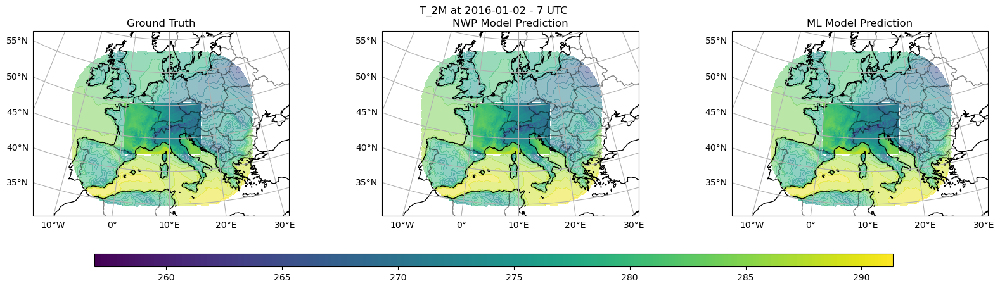

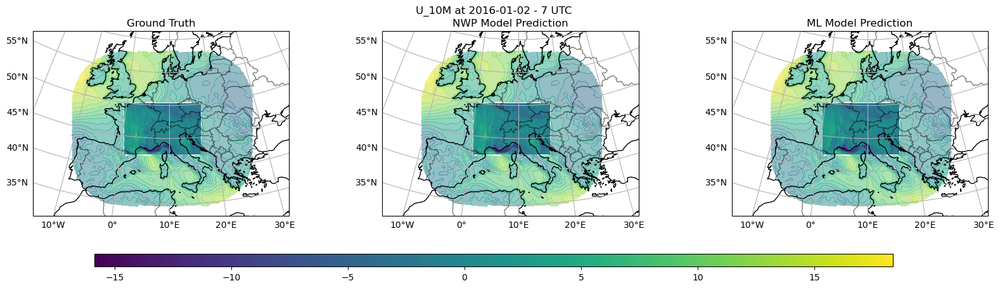

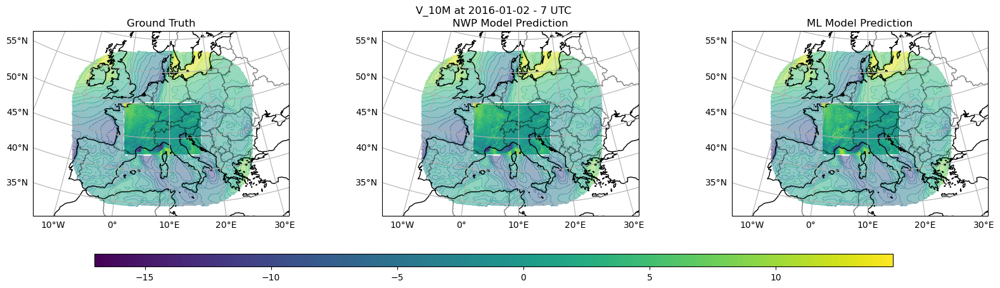

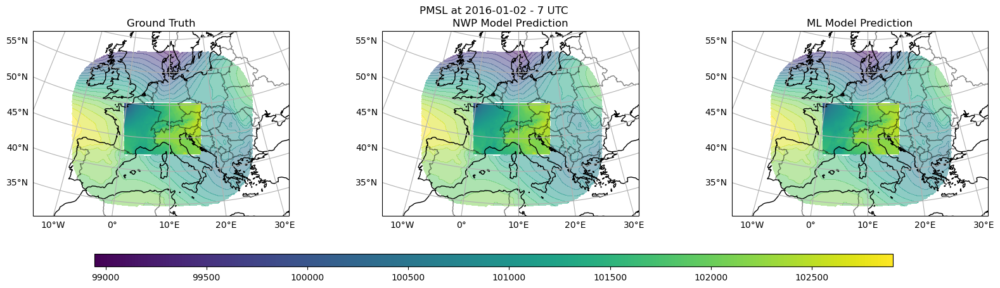

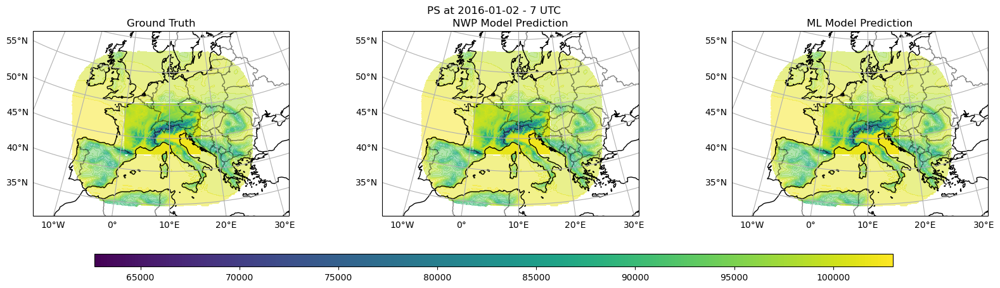

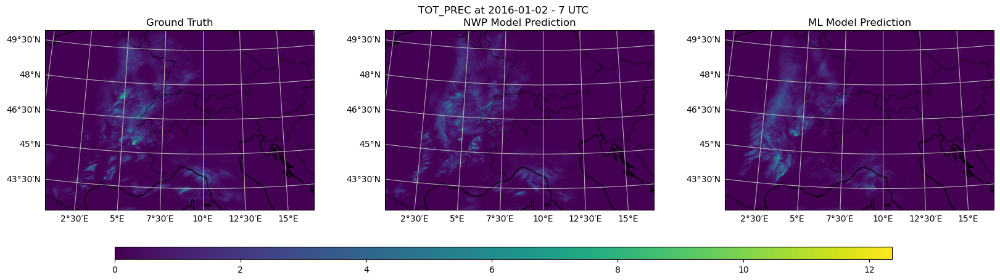

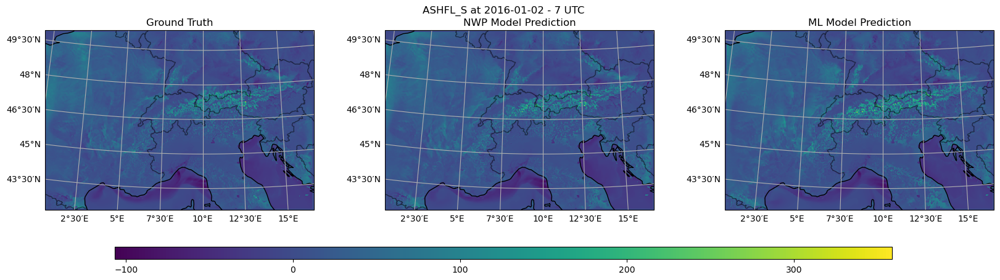

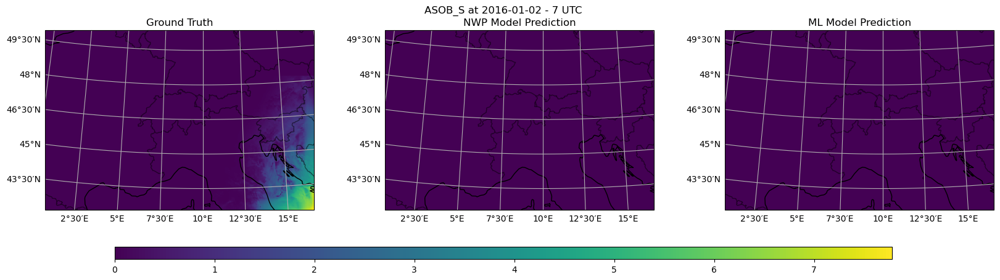

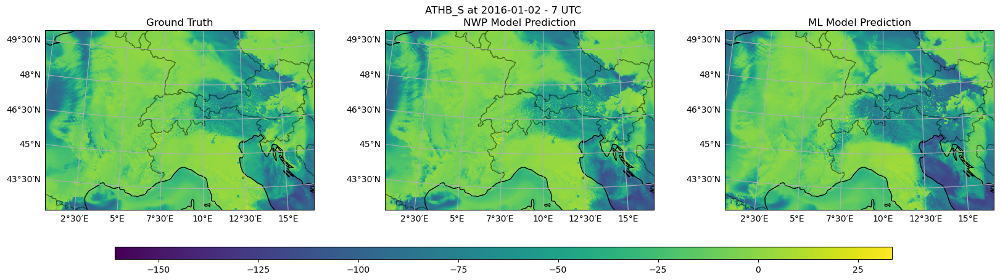

In [52]:
random.seed(RANDOM_SEED)
time_index = random.randint(0, len(ds_gt.time) - 1)
time_selected = ds_gt.time[time_index]
print(f"Selected time: {time_selected.values}")

for var in VARIABLES_2D:
    fig, axes = plt.subplots(
        1, 3, figsize=(21, 4), dpi=DPI, subplot_kw={"projection": PROJECTION}
    )

    # Get corresponding ERA5 variable name
    era5_var = var_mapping.get(var)

    # Select data first
    ds_var = ds_gt[var].isel(time=time_index)
    ds_nwp_var = ds_nwp[var].isel(time=time_index)
    ds_ml_var = ds_ml[var].isel(time=time_index)

    # Combine all arrays for min/max calculation
    arrays_for_minmax = [ds_var.values, ds_nwp_var.values, ds_ml_var.values]

    if era5_var and era5_var in ds_cropped:
        ds_cropped_var = ds_cropped[era5_var].isel(time=time_index)
        arrays_for_minmax.append(ds_cropped_var.values)

    # Calculate global min/max
    combined_array = np.concatenate([
        arr.flatten() for arr in arrays_for_minmax
    ])
    vmin = np.nanmin(combined_array)
    vmax = np.nanmax(combined_array)

    # Plot boundaries first for all subplots
    if era5_var and era5_var in ds_cropped:
        ds_cropped_var = ds_cropped[era5_var].isel(time=time_index)

        for ax in axes:
            cs = ax.contourf(
                lon_mesh,
                lat_mesh,
                ds_cropped_var.values,
                transform=ccrs.PlateCarree(),
                cmap="viridis",
                vmin=vmin,
                vmax=vmax,
                alpha=0.5,
                levels=20,
            )

    # Plot ground truth
    im0 = axes[0].pcolormesh(
        lons,
        lats,
        ds_var.values,
        transform=ccrs.PlateCarree(),
        vmin=vmin,
        vmax=vmax,
        cmap="viridis",
        shading="auto",
    )
    axes[0].set_title("Ground Truth")

    # Plot NWP prediction
    im1 = axes[1].pcolormesh(
        lons,
        lats,
        ds_nwp_var.values,
        transform=ccrs.PlateCarree(),
        vmin=vmin,
        vmax=vmax,
        cmap="viridis",
        shading="auto",
    )
    axes[1].set_title("NWP Model Prediction")

    # Plot ML prediction
    im2 = axes[2].pcolormesh(
        lons,
        lats,
        ds_ml_var.values,
        transform=ccrs.PlateCarree(),
        vmin=vmin,
        vmax=vmax,
        cmap="viridis",
        shading="auto",
    )
    axes[2].set_title("ML Model Prediction")

    for ax in axes:
        ax.coastlines(resolution="50m")
        ax.add_feature(cfeature.BORDERS, linestyle="-", alpha=0.5)
        gl = ax.gridlines(
            draw_labels=True,
            dms=True,
            x_inline=False,
            y_inline=False,
        )
        gl.top_labels = False
        gl.right_labels = False

    # Add colorbar
    cbar_ax = fig.add_axes([0.2, -0.05, 0.6, 0.05])
    cbar = fig.colorbar(im0, cax=cbar_ax, orientation="horizontal")

    # Add units to the colorbar
    units = ds_gt[var].attrs.get("units", "")
    cbar.set_label(units)

    # Adjust subplot spacing
    plt.subplots_adjust(bottom=0.15, hspace=0.05, wspace=0.05)
    plt.suptitle(
        f"{var} at {str(time_selected.dt.date.values)} - {time_selected.dt.hour.values} UTC"
    )
    plt.show()

#### Error Plots for 2D Variables

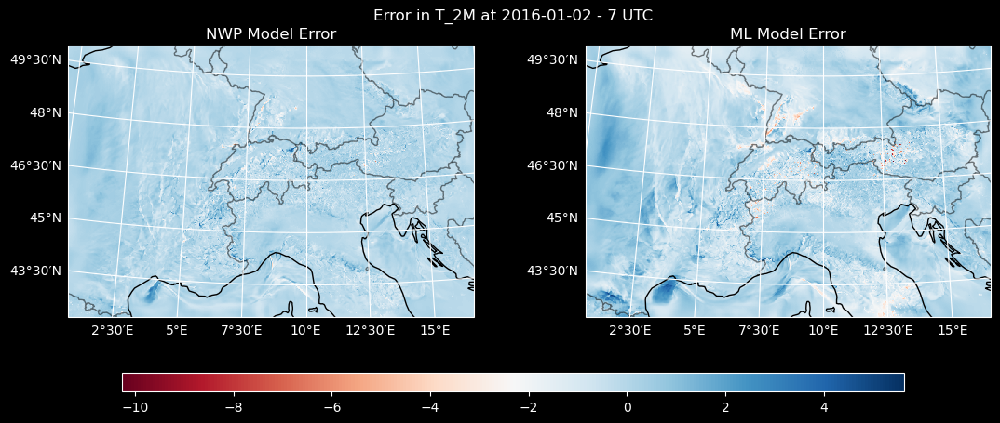

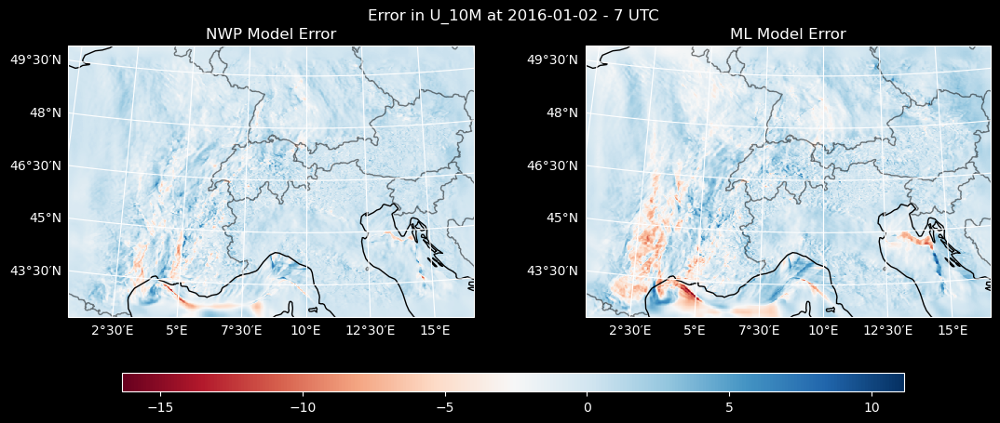

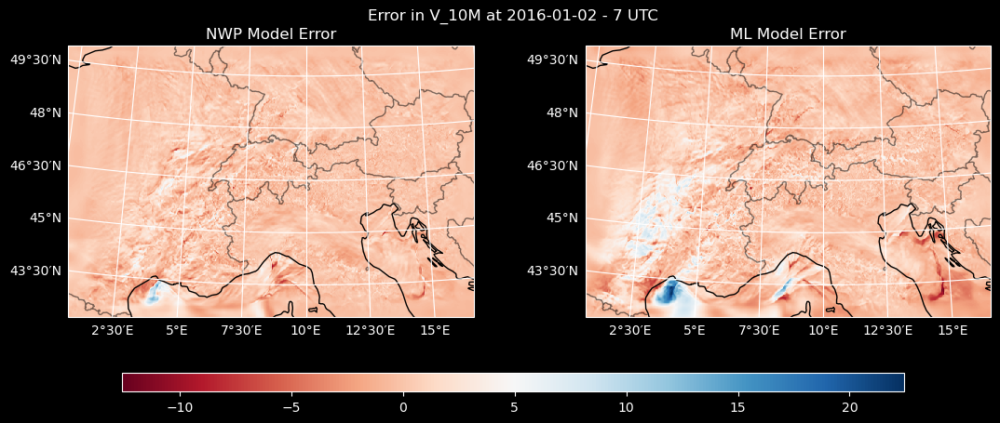

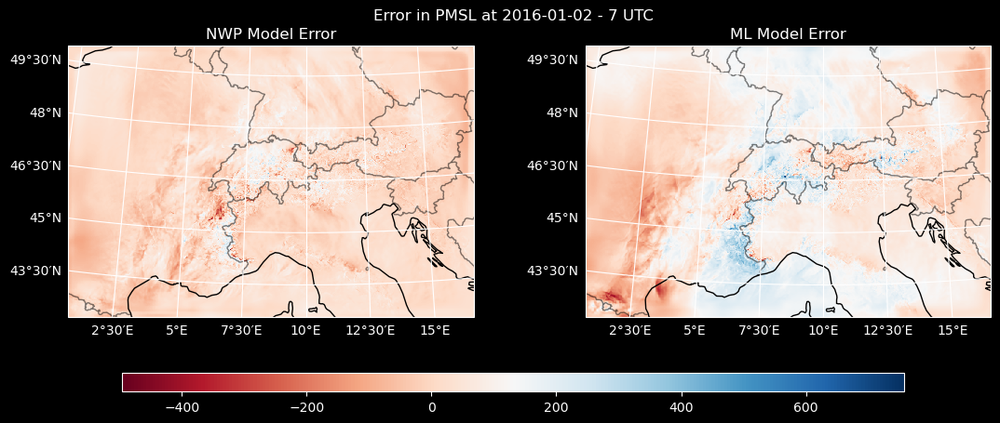

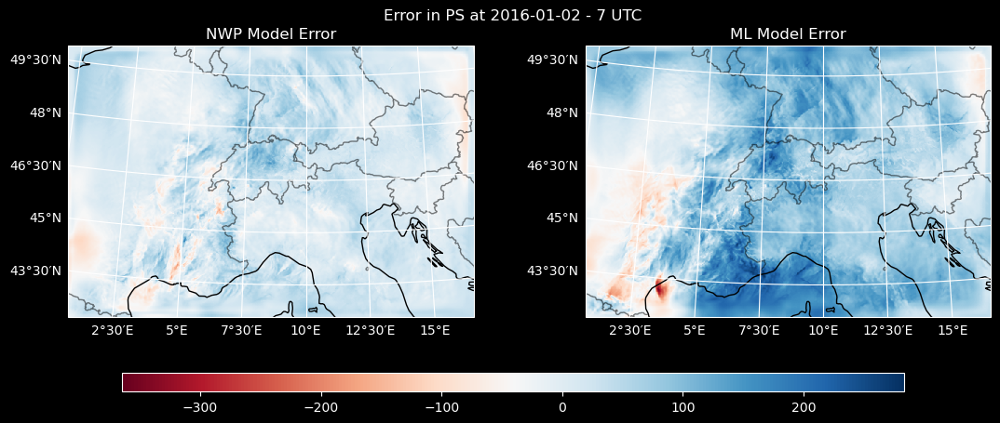

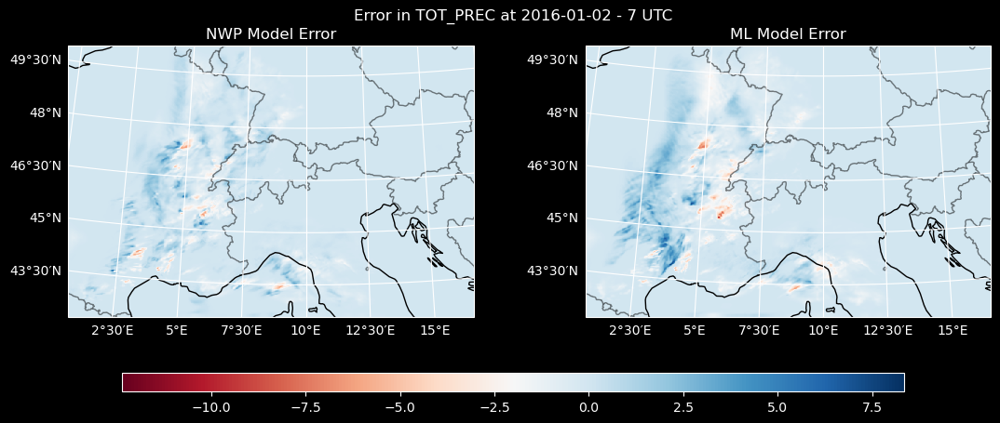

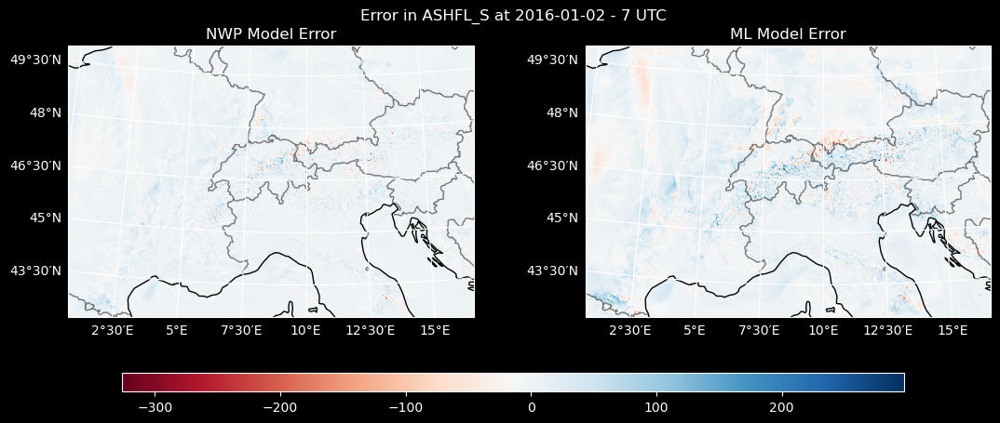

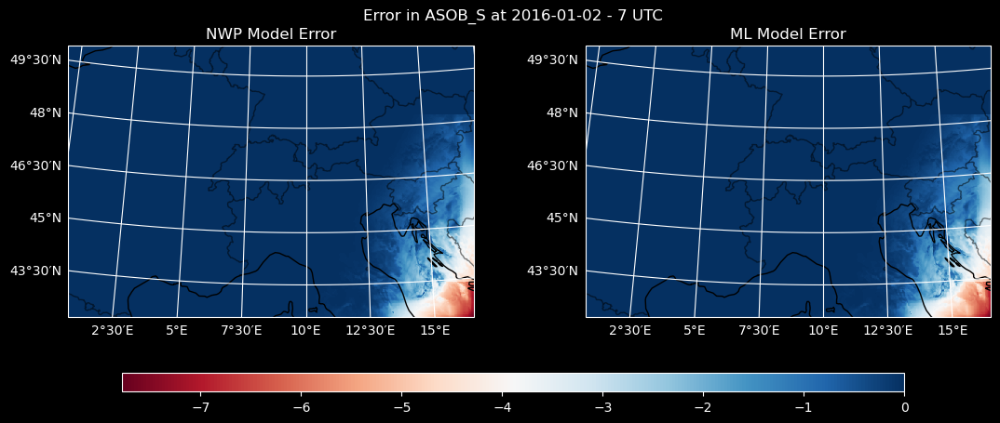

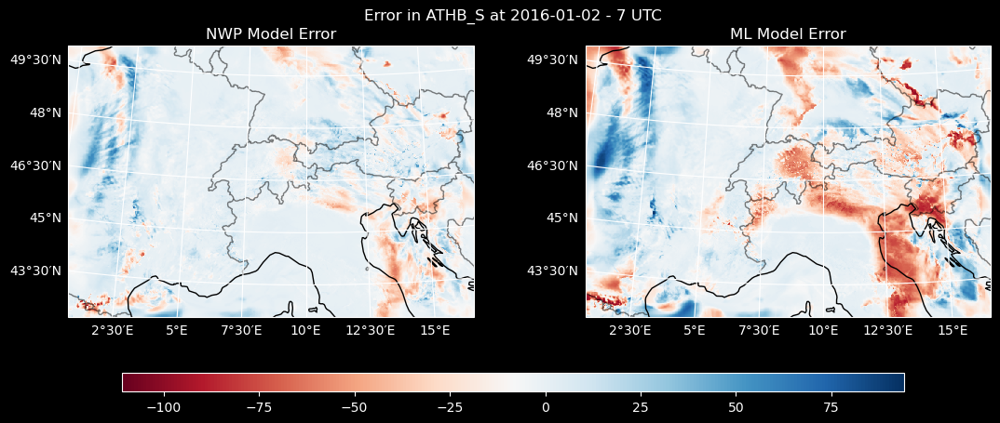

In [14]:
for var in VARIABLES_2D:
    fig, axes = plt.subplots(
        1,
        2,
        figsize=(14, 4),
        dpi=DPI,
        subplot_kw={"projection": PROJECTION},
    )

    ds_var = ds_gt[var].isel(time=time_index)
    ds_nwp_var = ds_nwp[var].isel(time=time_index)
    ds_ml_var = ds_ml[var].isel(time=time_index)

    error_nwp = ds_nwp_var - ds_var
    error_ml = ds_ml_var - ds_var

    vmin = min(error_nwp.min().values, error_ml.min().values)
    vmax = max(error_nwp.max().values, error_ml.max().values)

    # Get coordinates
    if hasattr(ds_gt, "longitude") and hasattr(ds_gt, "latitude"):
        lons = ds_gt.longitude.values
        lats = ds_gt.latitude.values
    elif hasattr(ds_gt, "lon") and hasattr(ds_gt, "lat"):
        lons = ds_gt.lon.values
        lats = ds_gt.lat.values

    # Plot NWP error
    im0 = axes[0].pcolormesh(
        lons,
        lats,
        error_nwp.values,
        transform=ccrs.PlateCarree(),
        vmin=vmin,
        vmax=vmax,
        cmap="RdBu",
        shading="auto",
    )
    axes[0].set_title("NWP Model Error")

    # Plot ML error
    im1 = axes[1].pcolormesh(
        lons,
        lats,
        error_ml.values,
        transform=ccrs.PlateCarree(),
        vmin=vmin,
        vmax=vmax,
        cmap="RdBu",
        shading="auto",
    )
    axes[1].set_title("ML Model Error")

    for ax in axes:
        ax.coastlines(resolution="50m")
        ax.add_feature(cfeature.BORDERS, linestyle="-", alpha=0.5)
        gl = ax.gridlines(
            draw_labels=True,
            dms=True,
            x_inline=False,
            y_inline=False,
        )
        gl.top_labels = False
        gl.right_labels = False

    # Add colorbar
    cbar_ax = fig.add_axes([0.2, -0.05, 0.6, 0.05])
    cbar = fig.colorbar(im0, cax=cbar_ax, orientation="horizontal")

    # Add units to the colorbar
    units = ds_gt[var].attrs.get("units", "")
    cbar.set_label(units)

    # Adjust subplot spacing
    plt.subplots_adjust(bottom=0.15, hspace=0.05, wspace=0.05)
    plt.suptitle(
        f"Error in {var} at {str(time_selected.dt.date.values)} - {time_selected.dt.hour.values} UTC"
    )
    plt.show()

### 3D Variables
For variables that also have a vertical dimension the plots are displayed as
a mosaic plot, with each subplot representing a different height level. The
colorbar has shared global limits across all vertical levels.

In [ ]:
# Plot all 3D variables
for var in VARIABLES_3D:
    num_levels = len(Z)
    fig, axes = plt.subplots(
        num_levels,
        3,
        figsize=(21, 4 * num_levels),
        subplot_kw={"projection": PROJECTION},
        dpi=DPI,
    )

    ds_var = ds_gt[var].isel(time=time_index)
    ds_nwp_var = ds_nwp[var].isel(time=time_index)
    ds_ml_var = ds_ml[var].isel(time=time_index)

    # Get global min/max for consistent colorbar
    vmin = min(
        ds_var.min().values, ds_nwp_var.min().values, ds_ml_var.min().values
    )
    vmax = max(
        ds_var.max().values, ds_nwp_var.max().values, ds_ml_var.max().values
    )

    # Get coordinates
    lons = ds_gt.lon.values
    lats = ds_gt.lat.values

    for idx, z in enumerate(Z):
        ds_var_lev = ds_var.sel(z=z)
        ds_nwp_var_lev = ds_nwp_var.sel(z=z)
        ds_ml_var_lev = ds_ml_var.sel(z=z)

        # Plot Ground Truth
        im0 = axes[idx, 0].pcolormesh(
            lons,
            lats,
            ds_var_lev.values,
            transform=ccrs.PlateCarree(),
            vmin=vmin,
            vmax=vmax,
            cmap="viridis",
            shading="auto",
        )
        axes[idx, 0].set_title(f"Ground Truth - Level {z}")

        # Plot NWP prediction
        im1 = axes[idx, 1].pcolormesh(
            lons,
            lats,
            ds_nwp_var_lev.values,
            transform=ccrs.PlateCarree(),
            vmin=vmin,
            vmax=vmax,
            cmap="viridis",
            shading="auto",
        )
        axes[idx, 1].set_title(f"NWP Model - Level {z}")

        # Plot ML prediction
        im2 = axes[idx, 2].pcolormesh(
            lons,
            lats,
            ds_ml_var_lev.values,
            transform=ccrs.PlateCarree(),
            vmin=vmin,
            vmax=vmax,
            cmap="viridis",
            shading="auto",
        )
        axes[idx, 2].set_title(f"ML Model - Level {z}")

        # Add map features
        for ax in axes[idx]:
            ax.coastlines(resolution="50m")
            ax.add_feature(cfeature.BORDERS, linestyle="-", alpha=0.5)
            gl = ax.gridlines(draw_labels=True)
            gl.top_labels = False
            gl.right_labels = False

    # Add one colorbar for all subplots at the bottom
    cbar_ax = fig.add_axes([0.2, 0.01, 0.6, 0.01])
    cbar = fig.colorbar(im0, cax=cbar_ax, orientation="horizontal")

    # Add units to the colorbar
    units = ds_gt[var].attrs.get("units", "")
    cbar.set_label(units)

    plt.suptitle(
        f"{var} at {str(time_selected.dt.date.values)} - {time_selected.dt.hour.values} UTC"
    )
    plt.subplots_adjust(bottom=0.05, top=0.95, hspace=0.1, wspace=0.05)
    plt.show()

#### Error Plots for 3D Variables

In [ ]:
for var in VARIABLES_3D:
    num_levels = len(Z)
    fig, axes = plt.subplots(
        num_levels,
        2,
        figsize=(14, 4 * num_levels),
        subplot_kw={"projection": PROJECTION},
        dpi=DPI,
    )

    ds_var = ds_gt[var].isel(time=time_index)
    ds_nwp_var = ds_nwp[var].isel(time=time_index)
    ds_ml_var = ds_ml[var].isel(time=time_index)

    # Get coordinates
    lons = ds_gt.lon.values
    lats = ds_gt.lat.values

    for idx, z in enumerate(Z):
        ds_var_lev = ds_var.sel(z=z)
        ds_nwp_var_lev = ds_nwp_var.sel(z=z)
        ds_ml_var_lev = ds_ml_var.sel(z=z)

        error_nwp = ds_nwp_var_lev - ds_var_lev
        error_ml = ds_ml_var_lev - ds_var_lev

        vmin = min(error_nwp.min().values, error_ml.min().values)
        vmax = max(error_nwp.max().values, error_ml.max().values)

        # Plot NWP error
        im0 = axes[idx, 0].pcolormesh(
            lons,
            lats,
            error_nwp.values,
            transform=ccrs.PlateCarree(),
            vmin=vmin,
            vmax=vmax,
            cmap="RdBu",
            shading="auto",
        )
        axes[idx, 0].set_title(f"NWP Model Error - Level {z}")

        # Plot ML error
        im1 = axes[idx, 1].pcolormesh(
            lons,
            lats,
            error_ml.values,
            transform=ccrs.PlateCarree(),
            vmin=vmin,
            vmax=vmax,
            cmap="RdBu",
            shading="auto",
        )
        axes[idx, 1].set_title(f"ML Model Error - Level {z}")

        # Add map features
        for ax in axes[idx]:
            ax.coastlines(resolution="50m")
            ax.add_feature(cfeature.BORDERS, linestyle="-", alpha=0.5)
            gl = ax.gridlines(draw_labels=True)
            gl.top_labels = False
            gl.right_labels = False

    # Add one colorbar for all subplots at the bottom
    cbar_ax = fig.add_axes([0.2, 0.01, 0.6, 0.01])
    cbar = fig.colorbar(im0, cax=cbar_ax, orientation="horizontal")

    # Add units to the colorbar
    units = ds_gt[var].attrs.get("units", "")
    cbar.set_label(units)

    plt.suptitle(
        f"Error in {var} at {str(time_selected.dt.date.values)} - {time_selected.dt.hour.values} UTC"
    )
    plt.subplots_adjust(bottom=0.05, top=0.95, hspace=0.1, wspace=0.05)
    plt.show()

### 2. Histograms

### 2D Variables

By examining these distributions, we can assess whether the ML model and NWP model accurately capture the variability and frequency of different atmospheric states.

**Distribution Shape:** The histograms show whether the models replicate the skewness, kurtosis, and overall shape of the ERA5 data distributions.

**Extreme Values:** Identifying how the models handle extreme conditions, such as unusually high or low temperatures, is crucial for weather prediction and risk assessment.

**Normalization Needs:** Differences in scale between variables suggest that normalization may be necessary for accurate comparisons.

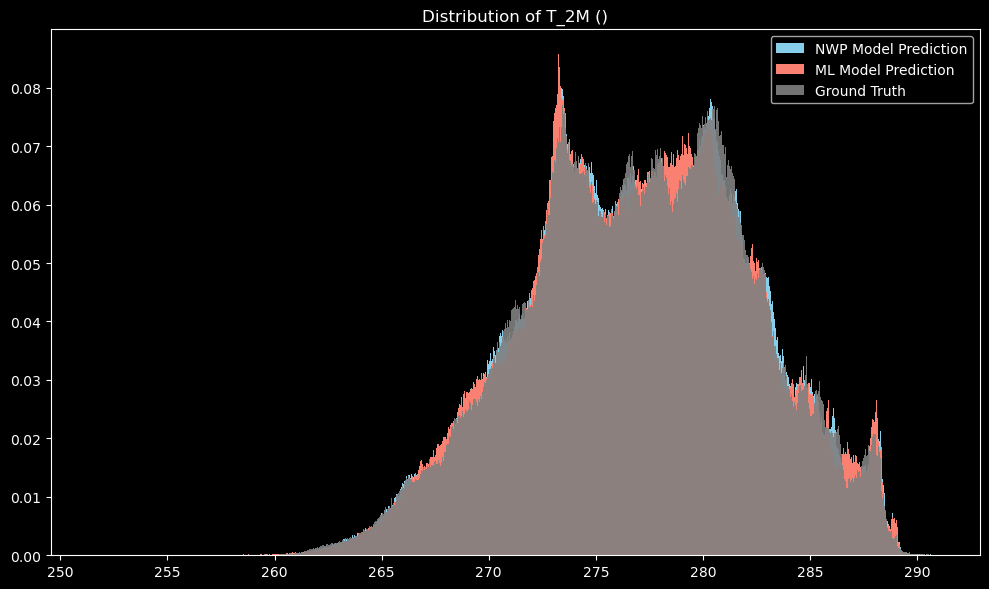

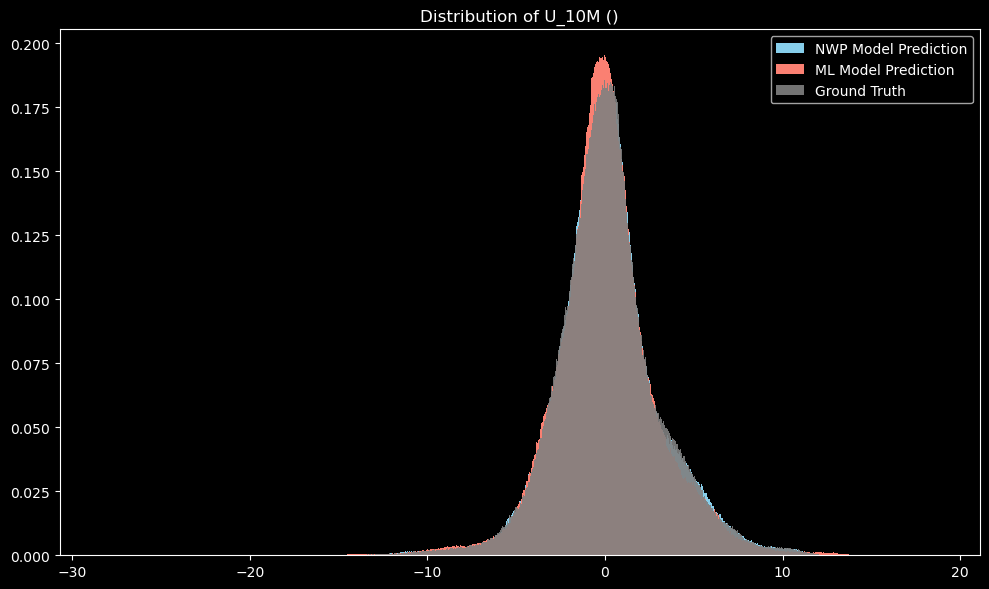

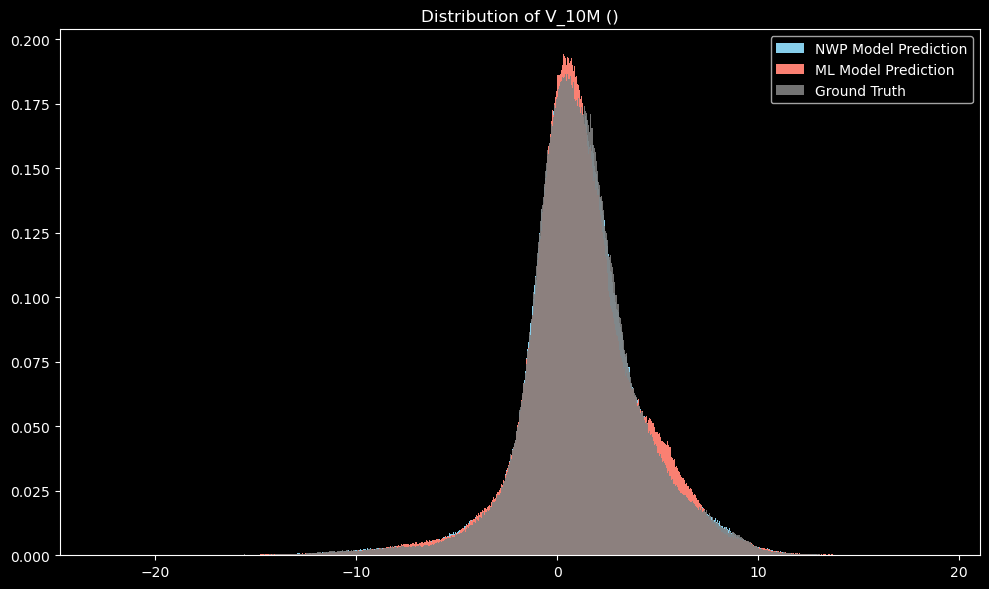

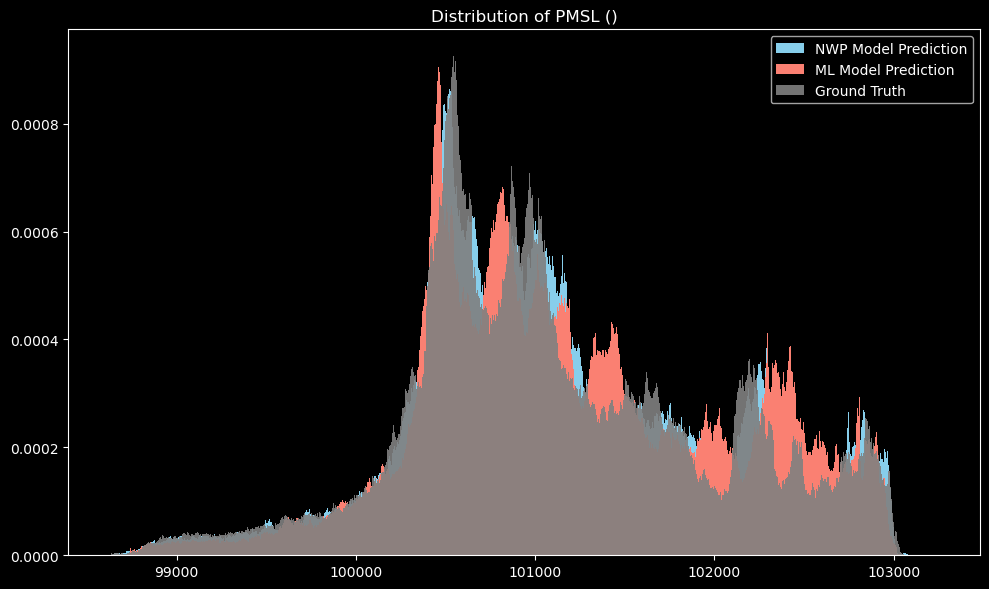

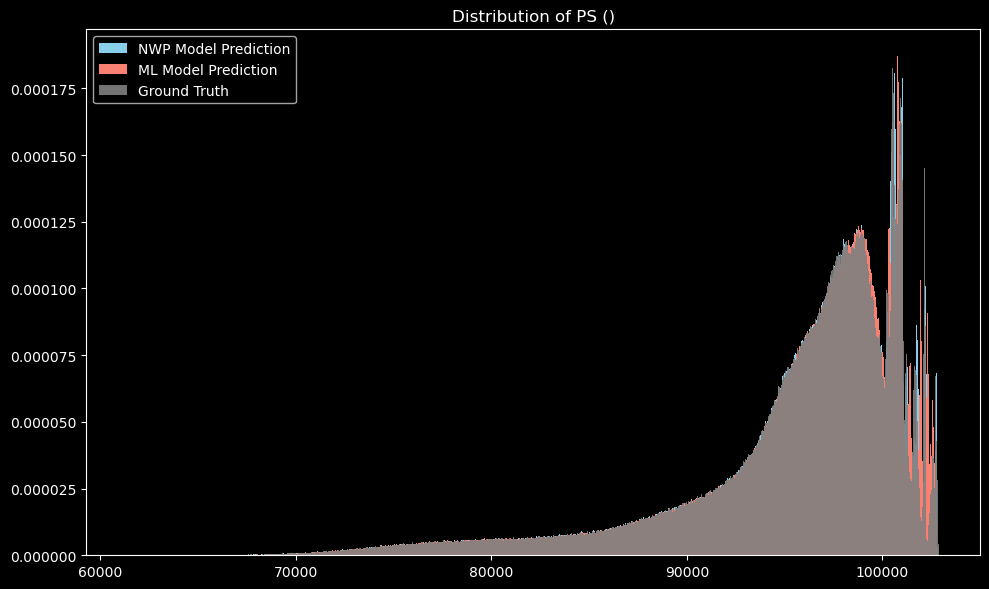

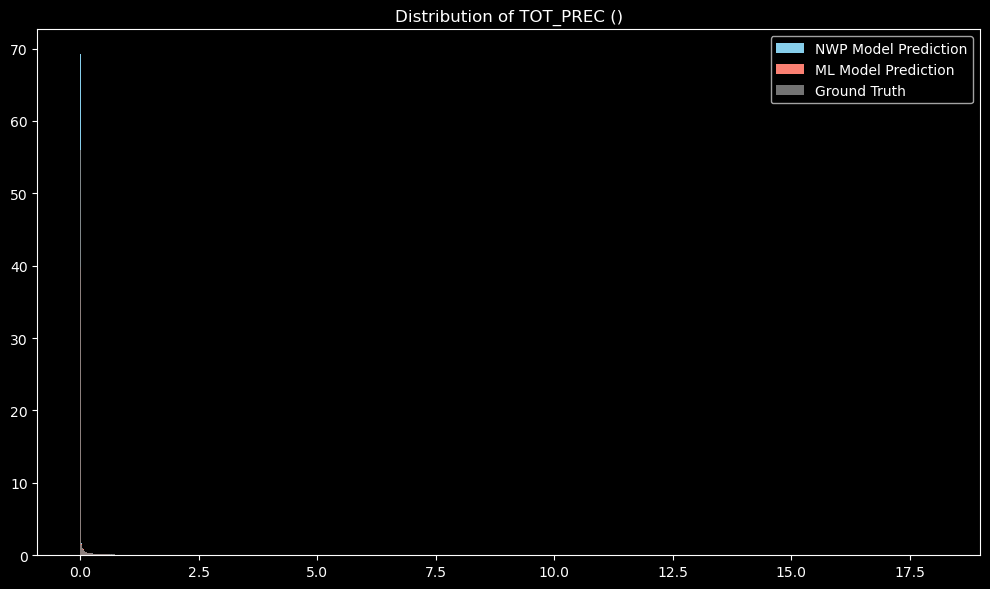

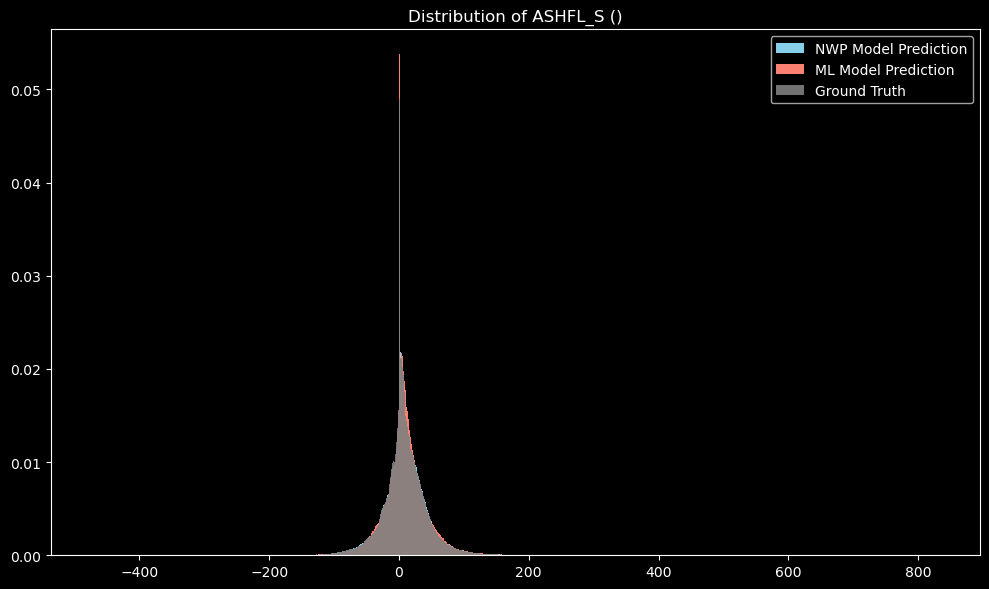

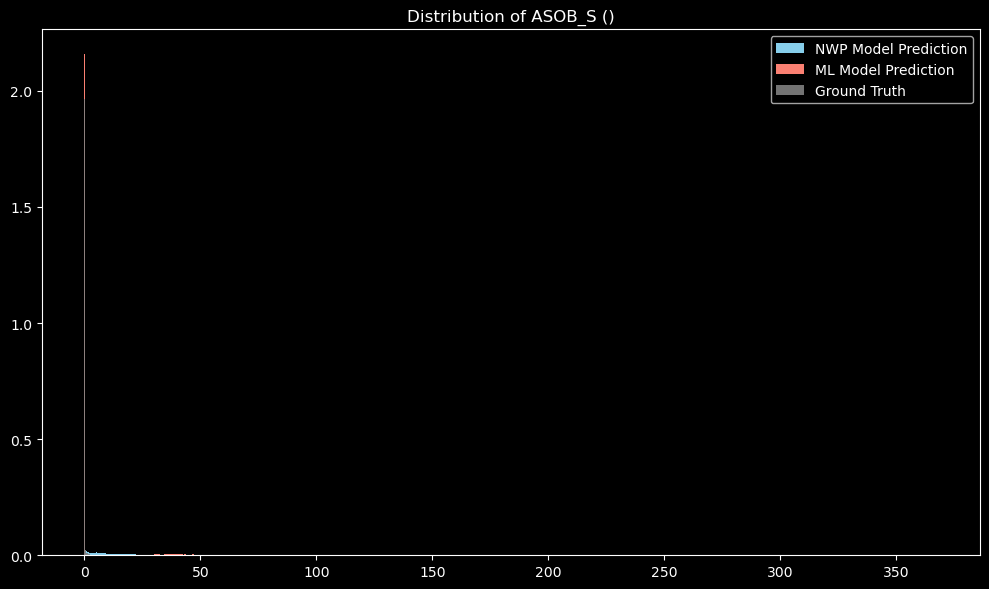

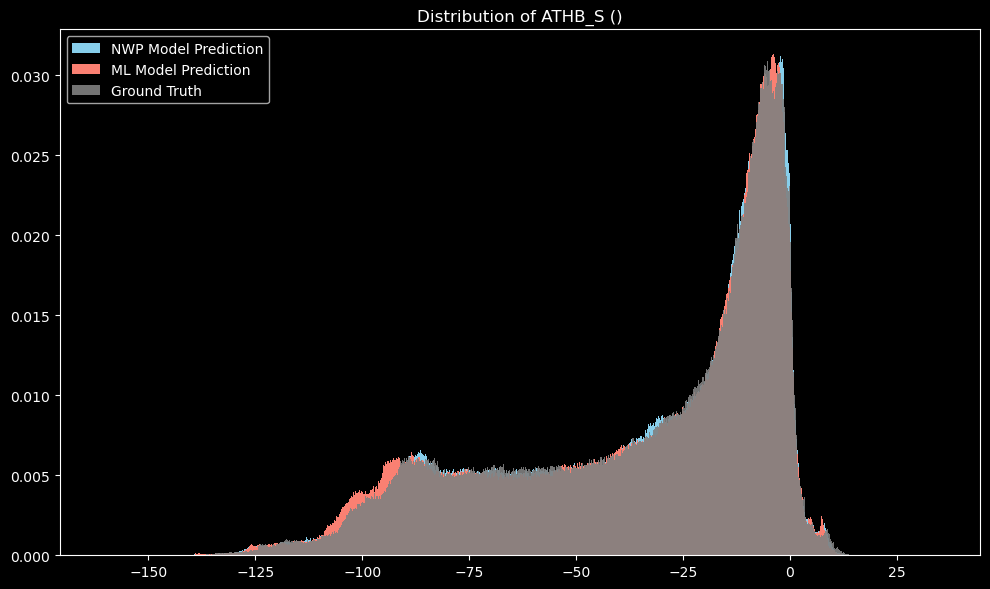

In [17]:
for variable_name in VARIABLES_2D:
    fig, ax = plt.subplots(figsize=(10, 6), dpi=DPI)

    # Get all data for the variable
    data_gt = ds_gt[variable_name].values.flatten()
    data_nwp = ds_nwp[variable_name].values.flatten()
    data_ml = ds_ml[variable_name].values.flatten()

    # Create histograms
    ax.hist(
        data_nwp,
        bins=1000,
        density=True,
        color="skyblue",
        label="NWP Model Prediction",
    )
    ax.hist(
        data_ml,
        bins=1000,
        density=True,
        color="salmon",
        label="ML Model Prediction",
    )
    ax.hist(
        data_gt,
        bins=1000,
        density=True,
        alpha=0.9,
        color="grey",
        label="Ground Truth",
    )

    # Add labels and title
    units = ds_gt[variable_name].attrs.get("units", "")
    ax.set_title(f"Distribution of {variable_name} ({units})")
    ax.legend()

    plt.tight_layout()
    plt.show()

### 3D Variables

In [ ]:
for variable_name in VARIABLES_3D:
    n_levels = len(Z)
    n_rows = (
        n_levels + 1
    ) // 2  # Ceiling division to handle odd number of levels
    fig, axs = plt.subplots(n_rows, 2, figsize=(16, 4 * n_rows), dpi=DPI)
    axs = axs.flatten()  # Flatten array for easier indexing

    for i, z in enumerate(Z):
        data_gt = ds_gt[variable_name].sel(z=z).values.flatten()
        data_nwp = ds_nwp[variable_name].sel(z=z).values.flatten()
        data_ml = ds_ml[variable_name].sel(z=z).values.flatten()

        axs[i].hist(
            data_nwp,
            bins=100,
            density=True,
            color="skyblue",
            label="NWP Model Prediction",
        )
        axs[i].hist(
            data_ml,
            bins=100,
            density=True,
            color="salmon",
            label="ML Model Prediction",
        )
        axs[i].hist(
            data_gt,
            bins=100,
            alpha=0.9,
            density=True,
            color="grey",
            label="Ground Truth",
        )
        axs[i].set_title(f"Level {z} hPa")
        axs[i].legend()

    # Hide empty subplots if odd number of levels
    for j in range(i + 1, len(axs)):
        axs[j].set_visible(False)

    units = ds_gt[variable_name].attrs.get("units", "")
    plt.suptitle(
        f"Distribution of {variable_name} ({units}) by pressure level",
        y=1.02,
    )
    plt.tight_layout()
    plt.show()

### 3. Wasserstein Distance + KDE

In this chapter, we delve deeper into the statistical comparison by employing the Wasserstein distance and Kernel Density Estimation (KDE). This provides a quantitative measure of how similar the distributions are between the ML model, NWP model, and Ground Truth data.

**Normalization**: Normalizing the data ensures that comparisons are not skewed by differing units or scales, allowing for a fair assessment across variables. The process of normalization might mask or exaggerate certain features. It's important to consider both normalized and raw data when drawing conclusions.

**Wasserstein Distance:** This metric quantifies the difference between two probability distributions, offering a single value that summarizes the discrepancy.

**KDE Plots:** KDEs provide a smooth estimate of the data distribution, making it easier to compare the overall shape and detect subtle differences.

**Interpretation of Wasserstein Distance:** A higher Wasserstein distance indicates greater divergence, but the acceptable threshold may vary depending on the context and variable.

### 2D Variables

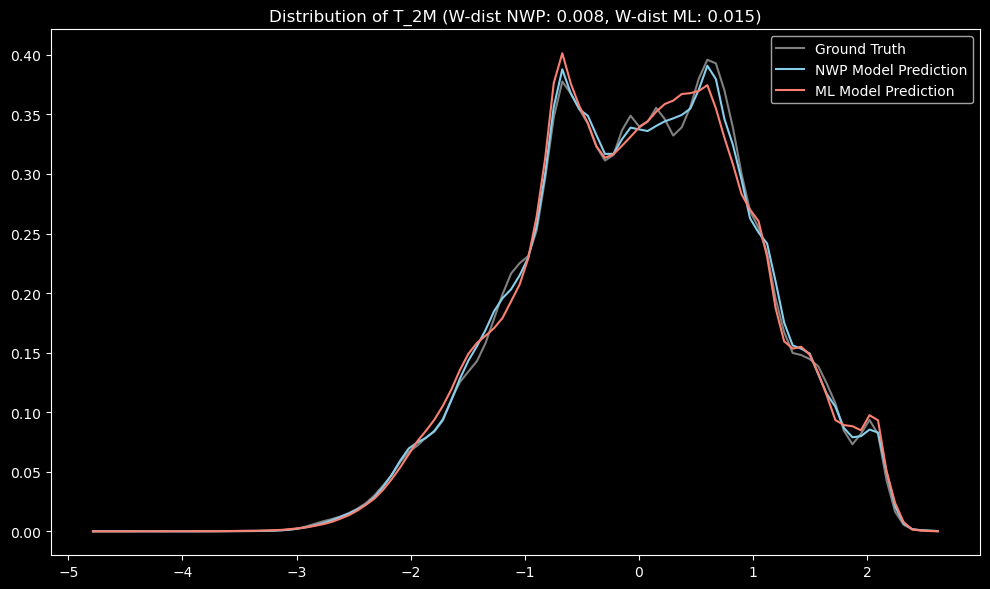

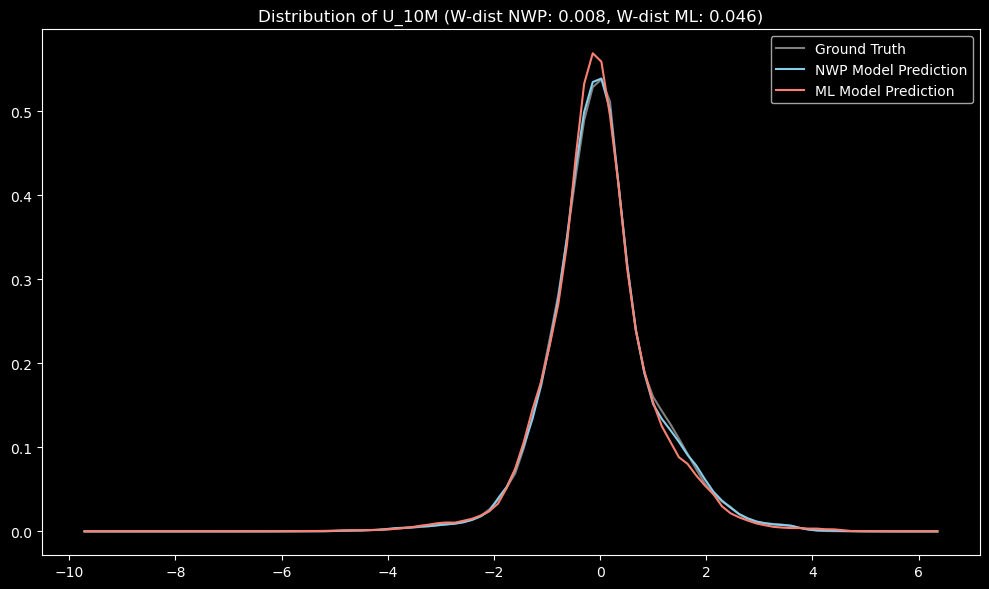

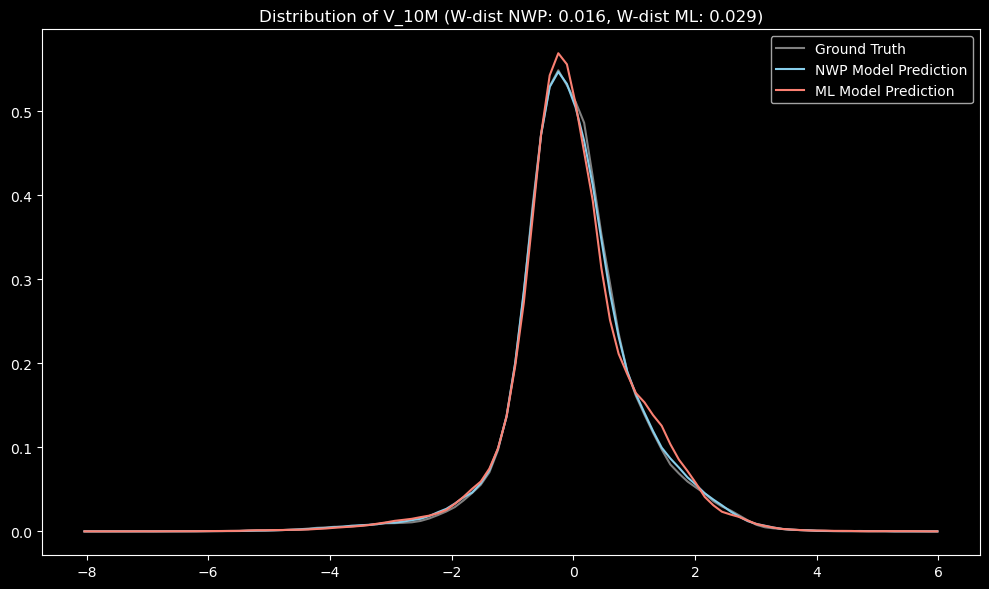

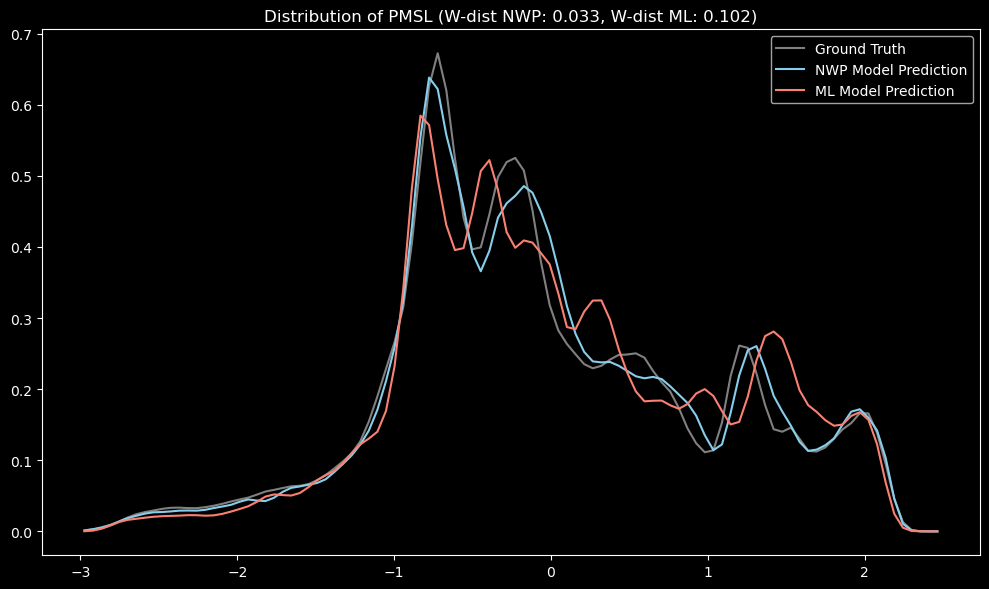

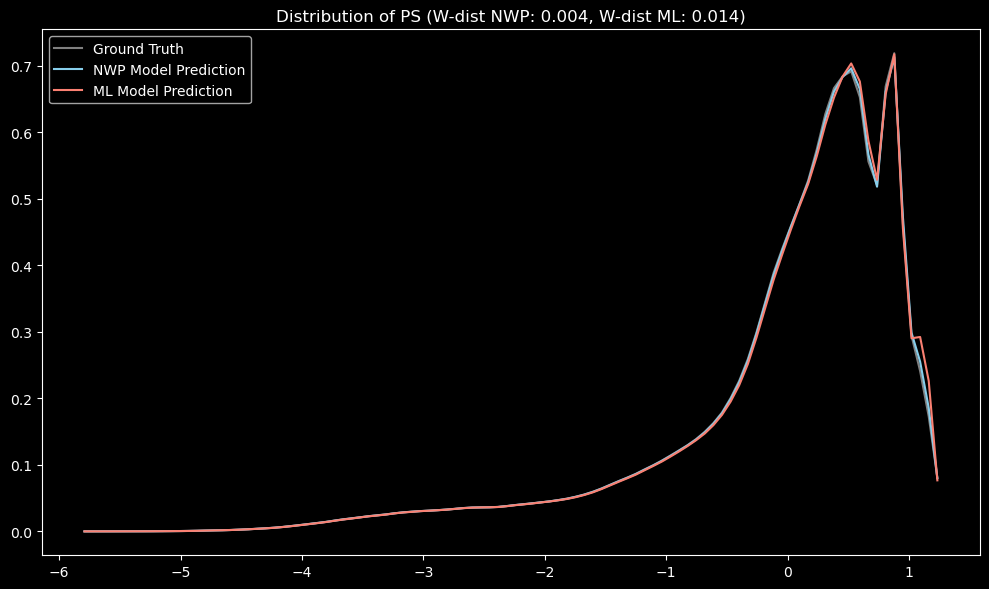

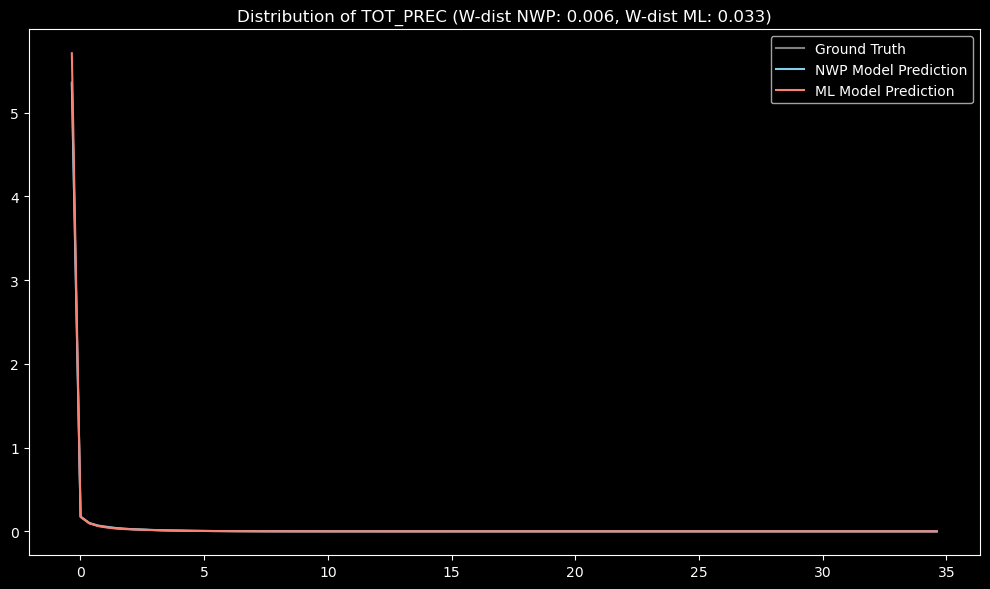

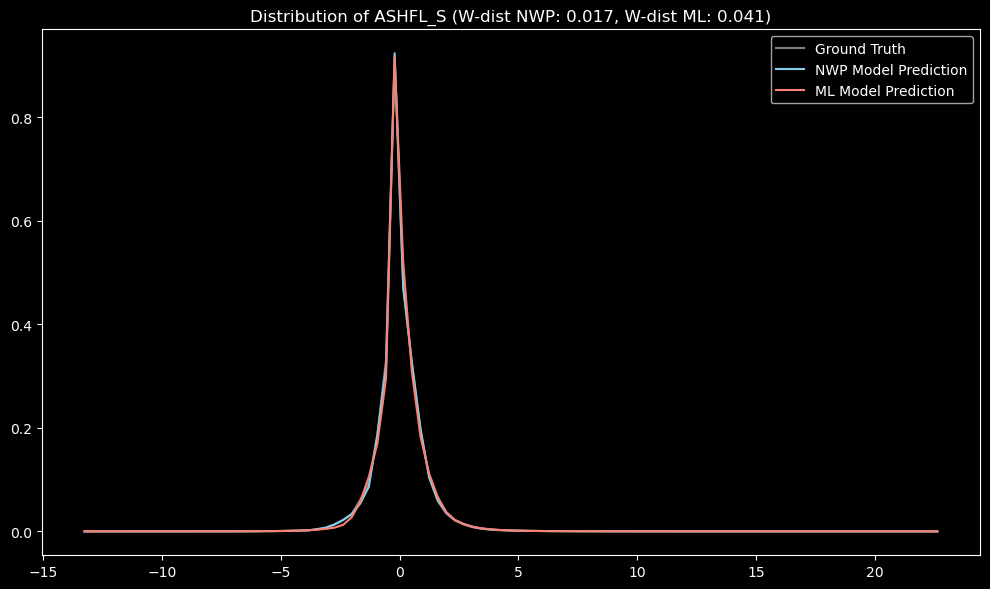

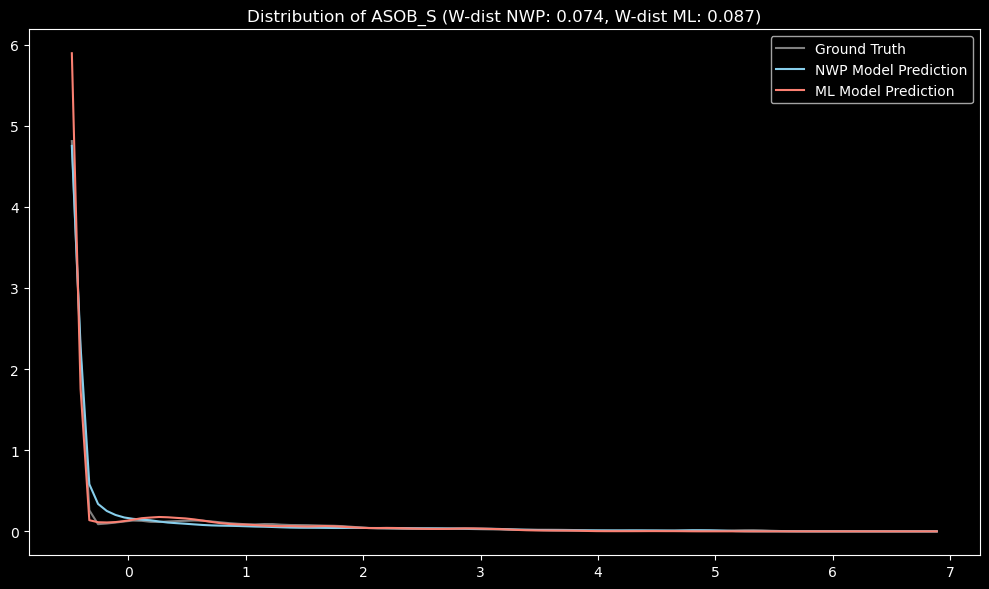

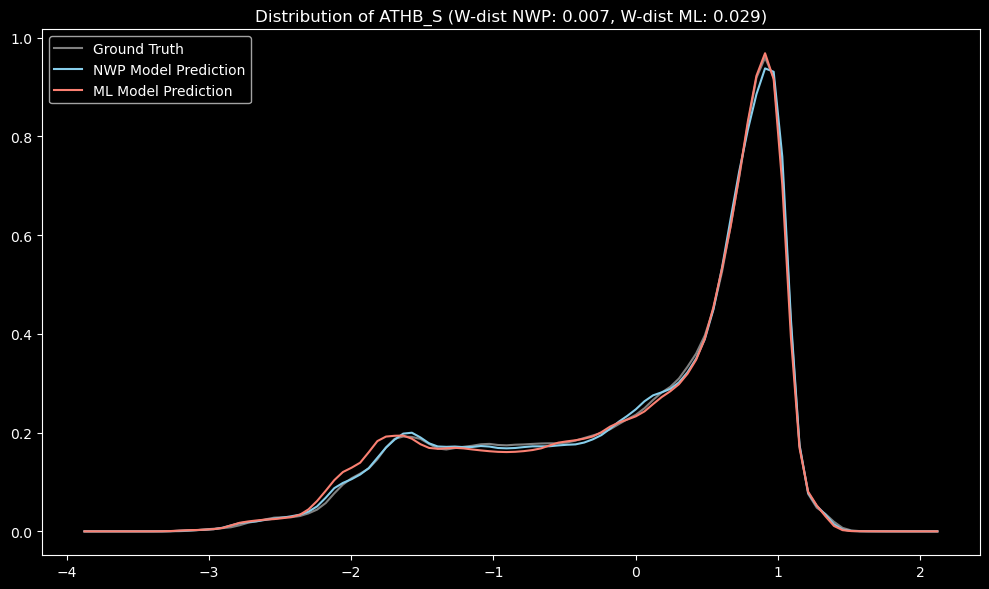

In [19]:
for variable_name in VARIABLES_2D:
    fig, ax = plt.subplots(figsize=(10, 6), dpi=DPI)

    # Get all data for the variable
    ds_flattened = ds_gt_standardized[variable_name].values.flatten()
    ds_nwp_flattened = ds_nwp_standardized[variable_name].values.flatten()
    ds_ml_flattened = ds_ml_standardized[variable_name].values.flatten()

    # Calculate Wasserstein distance on normalized data
    w_dist_nwp = wasserstein_distance(ds_flattened, ds_nwp_flattened)
    w_dist_ml = wasserstein_distance(ds_flattened, ds_ml_flattened)

    # Fit KDEs
    kde_ds = gaussian_kde(ds_flattened)
    kde_ds_nwp = gaussian_kde(ds_nwp_flattened)
    kde_ds_ml = gaussian_kde(ds_ml_flattened)

    # Evaluate KDEs
    x_eval = np.linspace(
        min(ds_flattened.min(), ds_nwp_flattened.min(), ds_ml_flattened.min()),
        max(ds_flattened.max(), ds_nwp_flattened.max(), ds_ml_flattened.max()),
        100,
    )

    ax.plot(
        x_eval,
        kde_ds(x_eval),
        color="grey",
        label="Ground Truth",
    )
    ax.plot(
        x_eval,
        kde_ds_nwp(x_eval),
        color="skyblue",
        label="NWP Model Prediction",
    )
    ax.plot(
        x_eval,
        kde_ds_ml(x_eval),
        color="salmon",
        label="ML Model Prediction",
    )

    ax.set_title(
        f"Distribution of {variable_name} (W-dist NWP: {w_dist_nwp:.3f}, W-dist ML: {w_dist_ml:.3f})"
    )
    ax.legend()

    plt.tight_layout()
    plt.show()

### 3D Variables
For 3d_variables, the Wasserstein distance is calculated for each vertical level
separately.


In [ ]:
for variable_name in VARIABLES_3D:
    n_levels = len(Z)
    n_rows = (
        n_levels + 1
    ) // 2  # Ceiling division to handle odd number of levels
    fig, axs = plt.subplots(n_rows, 2, figsize=(16, 4 * n_rows), dpi=DPI)
    axs = axs.flatten()  # Flatten array for easier indexing
    w_distances_nwp = []  # Store Wasserstein distances for each level
    w_distances_ml = []  # Store Wasserstein distances for each level

    for i, z in enumerate(Z):
        # Get data for this level
        ds_flattened = (
            ds_gt_standardized[variable_name].sel(z=z).values.flatten()
        )
        ds_nwp_flattened = (
            ds_nwp_standardized[variable_name].sel(z=z).values.flatten()
        )
        ds_ml_flattened = (
            ds_ml_standardized[variable_name].sel(z=z).values.flatten()
        )

        # Calculate Wasserstein distance on normalized data
        w_dist_nwp = wasserstein_distance(ds_flattened, ds_nwp_flattened)
        w_dist_ml = wasserstein_distance(ds_flattened, ds_ml_flattened)
        w_distances_nwp.append((z, w_dist_nwp))
        w_distances_ml.append((z, w_dist_ml))

        # Fit KDEs
        kde_ds = gaussian_kde(ds_flattened)
        kde_ds_nwp = gaussian_kde(ds_nwp_flattened)
        kde_ds_ml = gaussian_kde(ds_ml_flattened)

        # Evaluate KDEs
        x_eval = np.linspace(
            min(
                ds_flattened.min(),
                ds_nwp_flattened.min(),
                ds_ml_flattened.min(),
            ),
            max(
                ds_flattened.max(),
                ds_nwp_flattened.max(),
                ds_ml_flattened.max(),
            ),
            100,
        )

        axs[i].plot(x_eval, kde_ds(x_eval), color="grey", label="Ground Truth")
        axs[i].plot(
            x_eval,
            kde_ds_nwp(x_eval),
            color="skyblue",
            label="NWP Model Prediction",
        )
        axs[i].plot(
            x_eval,
            kde_ds_ml(x_eval),
            color="salmon",
            label="ML Model Prediction",
        )
        axs[i].set_title(
            f"Level {z} hPa (W-dist NWP: {w_dist_nwp:.3f}, W-dist ML: {w_dist_ml:.3f})"
        )
        axs[i].legend()

    # Hide empty subplots if odd number of levels
    for j in range(i + 1, len(axs)):
        axs[j].set_visible(False)

    plt.suptitle(
        f"Normalized Distribution of {variable_name} by pressure level\n"
        + f"Mean Wasserstein distance NWP: {np.mean([w[1] for w in w_distances_nwp]):.3f}, Mean Wasserstein distance ML: {np.mean([w[1] for w in w_distances_ml]):.3f}",
        y=1.02,
    )
    plt.tight_layout()
    plt.show()

### 4. Energy Spectra

This chapter examines how energy is distributed across different spatial scales
in the atmosphere by computing and comparing the energy spectra of both models.
This analysis is critical in understanding the models' capabilities to simulate
atmospheric processes ranging from large-scale weather systems to small-scale
turbulence.

**FFT Computation:** The Fast Fourier Transform (FFT) is used to transform spatial data into the frequency domain, revealing how different scales contribute to the overall energy.

**Consideration of Earth's Curvature:** Adjustments are made for latitude to accurately calculate physical distances, which is essential for a meaningful spectrum analysis.

**Scale Representation:** The energy spectra show whether the ML model captures the correct amount of energy at various spatial scales.

**Effective Resolution:** Identifying the effective resolution helps understand the smallest scales that the model can reliably simulate.

**Numerical Artifacts:** Limitations in numerical precision can introduce artifacts in the spectra, especially at the smallest scales.

**Reference Slopes:** Including k^(-3) and k^(-5/3) slopes provides
benchmarks based on theoretical expectations from atmospheric dynamics.
TODO: Are these slopes relevant for all variables or just turbulent kinetic
energy?

In [21]:
def calculate_energy_spectra(data):
    """Calculate the energy spectra of the given data using 2D FFT.

    Parameters
    ----------
    data : xarray.DataArray
        The data for which the energy spectra should be calculated.
        Expected dimensions: (x, y, time)

    Returns
    -------
    wavenumber : np.ndarray
        The isotropic wavenumbers.
    power : np.ndarray
        The power spectrum averaged over time and azimuthally.
    effective_resolution : float
        The effective resolution of the model.
    """
    # Get grid spacing in meters
    dx = abs(float(data.x[1] - data.x[0]))
    dy = abs(float(data.y[1] - data.y[0]))

    # Transpose data to (time, y, x) for FFT
    var_data = data.transpose("time", "y", "x")

    # Get dimensions
    nt, ny, nx = var_data.shape

    # Compute 2D FFT for each time step
    fft_data = np.fft.rfft2(var_data, axes=(-2, -1))  # (time, ky, kx)

    # Calculate power spectrum
    power_spectrum = np.abs(fft_data) ** 2

    # Get wavenumbers
    kx = np.fft.rfftfreq(nx, d=dx)  # x-direction wavenumbers
    ky = np.fft.fftfreq(ny, d=dy)  # y-direction wavenumbers

    # Create 2D wavenumber grid
    kxx, kyy = np.meshgrid(kx, ky)
    k_mag = np.sqrt(kxx**2 + kyy**2)  # Magnitude of wavenumber vector

    # Create wavenumber bins for azimuthal averaging
    k_bins = np.logspace(
        np.log10(k_mag[k_mag > 0].min()), np.log10(k_mag.max()), num=50
    )

    # Average power spectrum over time
    power_spectrum = power_spectrum.mean(axis=0)

    # Perform azimuthal averaging
    k_averaged = []
    power_averaged = []

    for i in range(len(k_bins) - 1):
        k_mask = (k_mag >= k_bins[i]) & (k_mag < k_bins[i + 1])
        if k_mask.any():
            k_averaged.append(np.mean(k_mag[k_mask]))
            power_averaged.append(np.mean(power_spectrum[k_mask]))

    # Convert to arrays
    k_averaged = np.array(k_averaged)
    power_averaged = np.array(power_averaged)

    # Calculate effective resolution (wavelength corresponding to 4dx)
    effective_resolution = 1 / (4 * dx)

    # Remove first and last two wavenumbers
    return (k_averaged[2:-2], power_averaged[2:-2], effective_resolution)


def plot_energy_spectra(ds_gt, ds_nwp, ds_ml, var, level=None):
    """Plot energy spectra comparison with LSD metric."""
    if level is not None:
        var_data = ds_gt[var].sel(z=level)
        var_data_nwp = ds_nwp[var].sel(z=level)
        var_data_ml = ds_ml[var].sel(z=level)
    else:
        var_data = ds_gt[var]
        var_data_nwp = ds_nwp[var]
        var_data_ml = ds_ml[var]

    # Calculate energy spectra
    wavenumber_gt, spectrum_gt, effective_resolution = calculate_energy_spectra(
        var_data
    )
    wavenumber_nwp, spectrum_nwp, _ = calculate_energy_spectra(var_data_nwp)
    wavenumber_ml, spectrum_ml, _ = calculate_energy_spectra(var_data_ml)

    # Create plot
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot spectra
    ax.loglog(wavenumber_gt, spectrum_gt, color="grey", label="Ground Truth")
    ax.loglog(
        wavenumber_nwp,
        spectrum_nwp,
        color="skyblue",
        label="NWP Model Prediction",
    )
    ax.loglog(
        wavenumber_ml,
        spectrum_ml,
        color="salmon",
        label="ML Model Prediction",
    )

    # Calculate and plot reference slopes
    k_min = min(wavenumber_gt.min(), wavenumber_nwp.min(), wavenumber_ml.min())
    k_max = max(wavenumber_gt.max(), wavenumber_nwp.max(), wavenumber_ml.max())
    k_range = np.logspace(np.log10(k_min + 1e-6), np.log10(k_max), 10)
    y_max = max(spectrum_gt.max(), spectrum_nwp.max(), spectrum_ml.max())

    # Plot effective resolution
    ax.axvline(
        effective_resolution,
        color="goldenrod",
        linestyle="--",
        label="Effective Model Resolution",
    )

    # Add LSD metric
    add_lsd_to_plot(ax, spectrum_gt, spectrum_nwp, spectrum_ml)

    # Customize plot
    ax.set_xlabel("Wavenumber [1/m]")
    ax.set_ylabel("Power Spectral Density")
    title = f"Energy Spectra Comparison for {var}"
    if level is not None:
        title += f" at Level {level} hPa"
    ax.set_title(title)
    ax.legend()
    ax.grid(True, which="both", ls="--", alpha=0.5)

    plt.tight_layout()
    return fig, ax


def calculate_log_spectral_distance(spectrum1, spectrum2, spectrum3):
    """
    Calculate the Log Spectral Distance between three power spectra
    """
    eps = 1e-10
    log_spec1 = np.log10(spectrum1 + eps)
    log_spec2 = np.log10(spectrum2 + eps)
    log_spec3 = np.log10(spectrum3 + eps)
    lsd_nwp = np.sqrt(np.mean((log_spec1 - log_spec2) ** 2))
    lsd_ml = np.sqrt(np.mean((log_spec1 - log_spec3) ** 2))
    return lsd_nwp, lsd_ml


def add_lsd_to_plot(ax, true_spectrum, nwp_spectrum, ml_spectrum):
    """
    Add LSD metric as text box to spectrum plot
    """
    lsd_nwp, lsd_ml = calculate_log_spectral_distance(
        true_spectrum, nwp_spectrum, ml_spectrum
    )
    textstr = f"LSD NWP = {lsd_nwp:.4f}, LSD ML = {lsd_ml:.4f}"
    props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)
    ax.text(
        0.4,
        0.05,
        textstr,
        transform=ax.transAxes,
        verticalalignment="top",
        bbox=props,
    )

### 2D Variables

To interpret the Log-Spectral Distance (LSD) metric:

Lower values indicate better similarity between spectra
- LSD = 0 means identical spectra

Typical values depend on the specific application, but generally:
- LSD < 1: Good similarity
- 1 < LSD < 2: Moderate differences
- LSD > 2: Significant differences

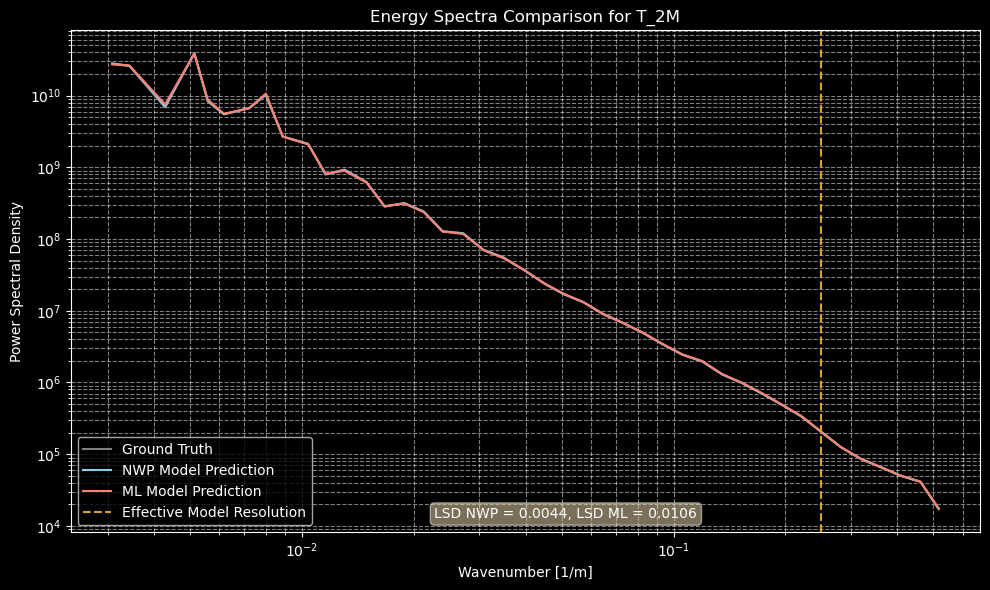

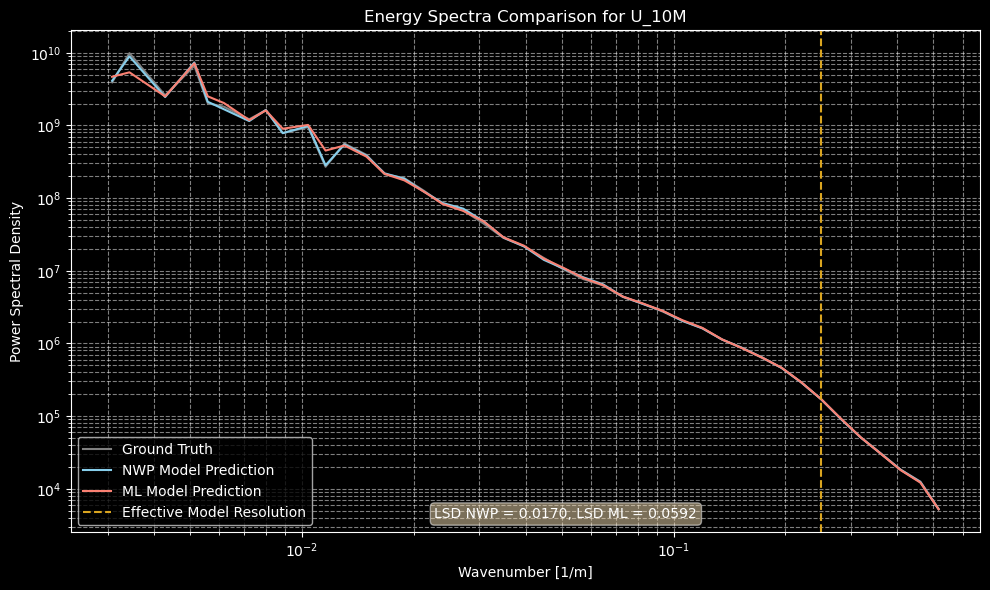

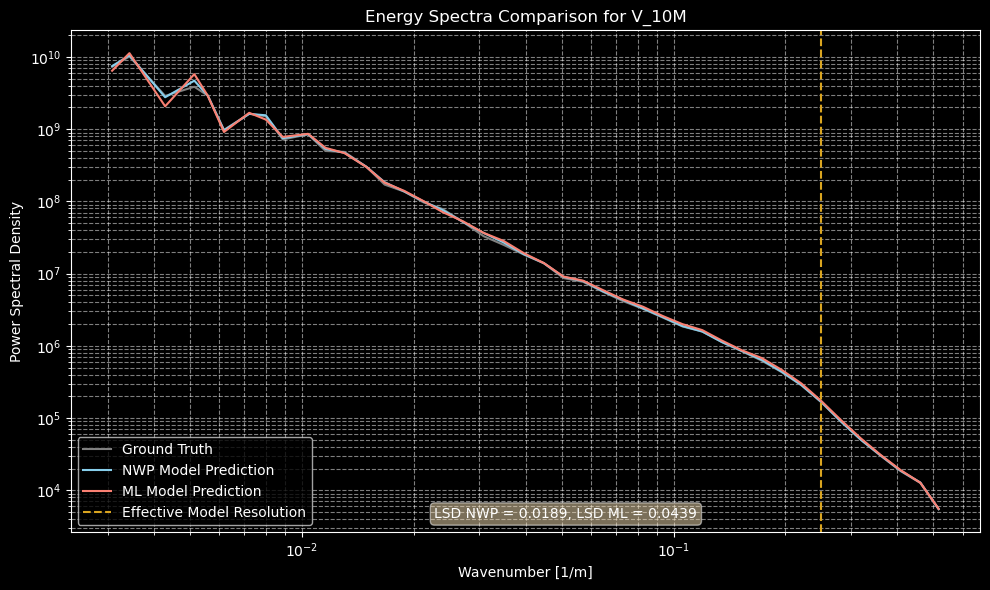

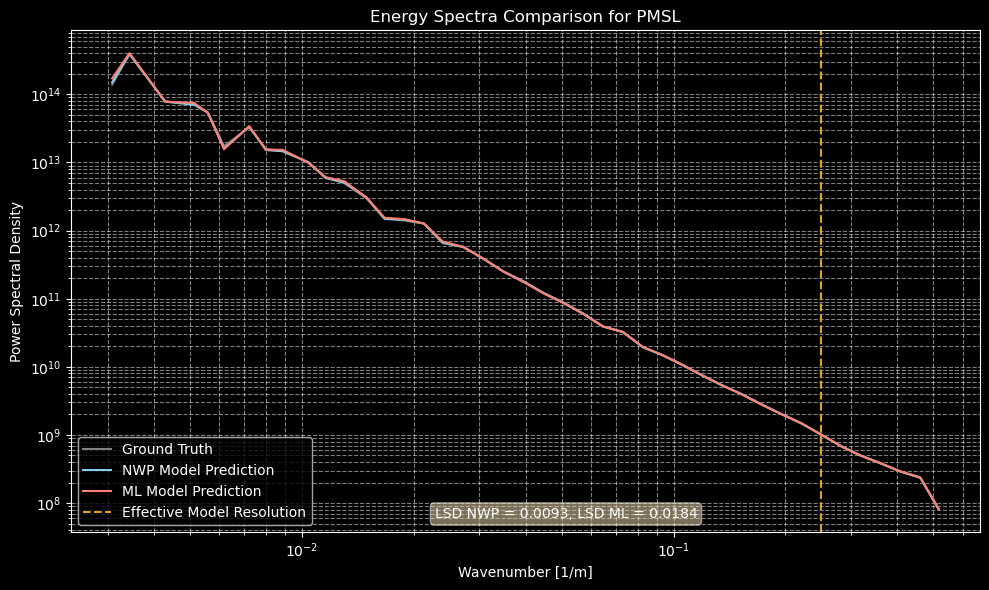

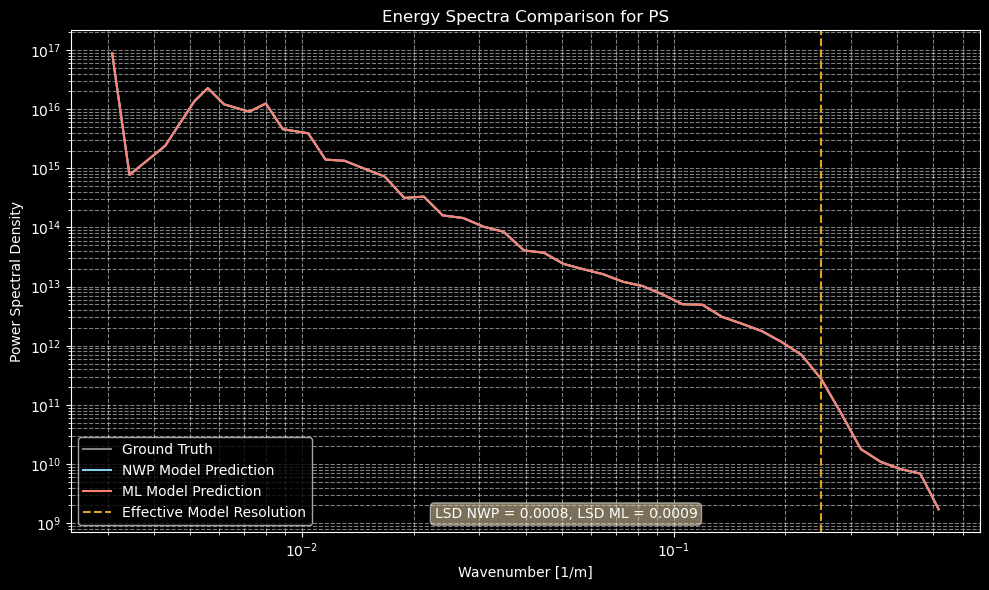

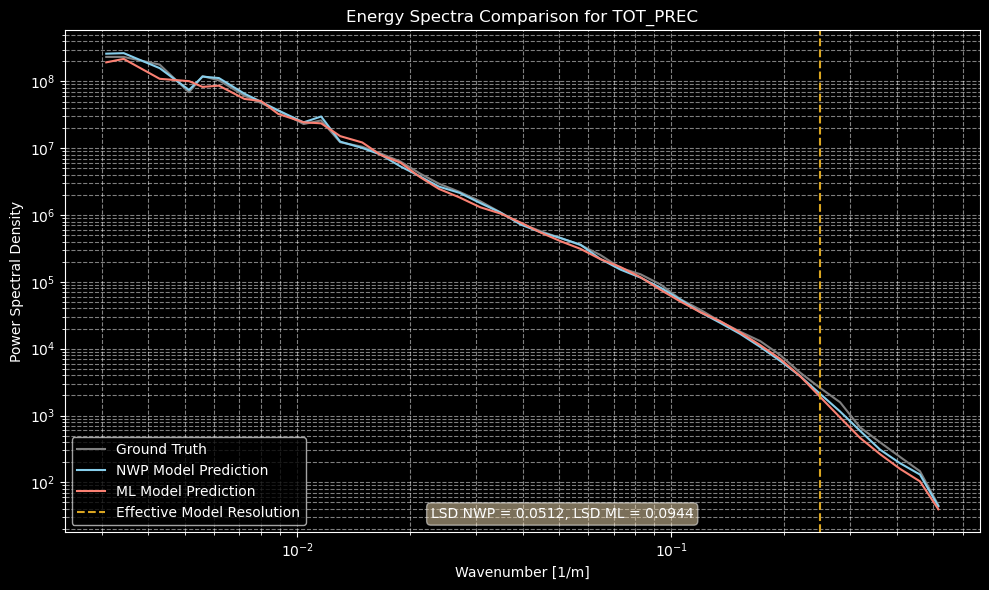

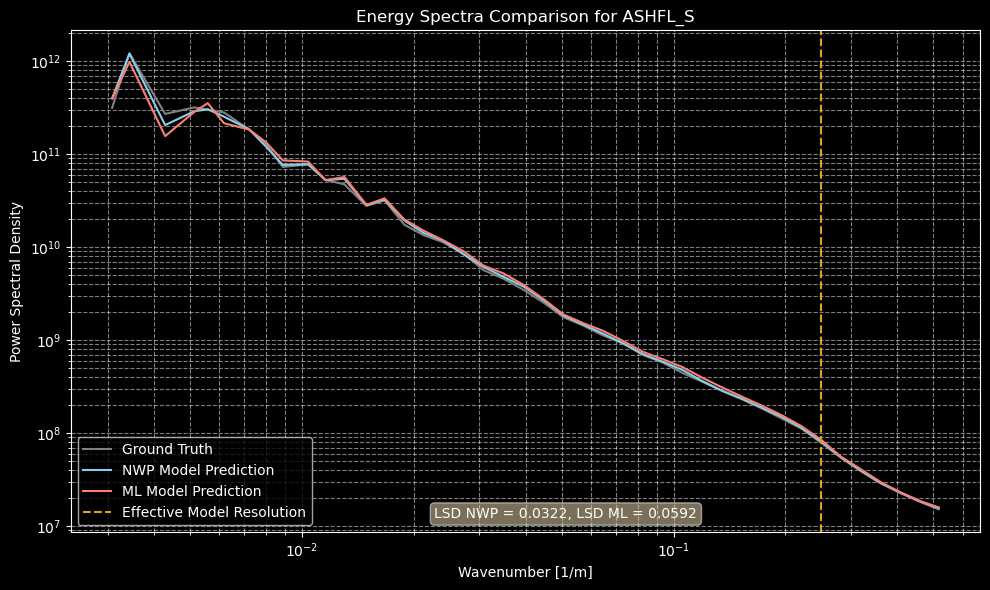

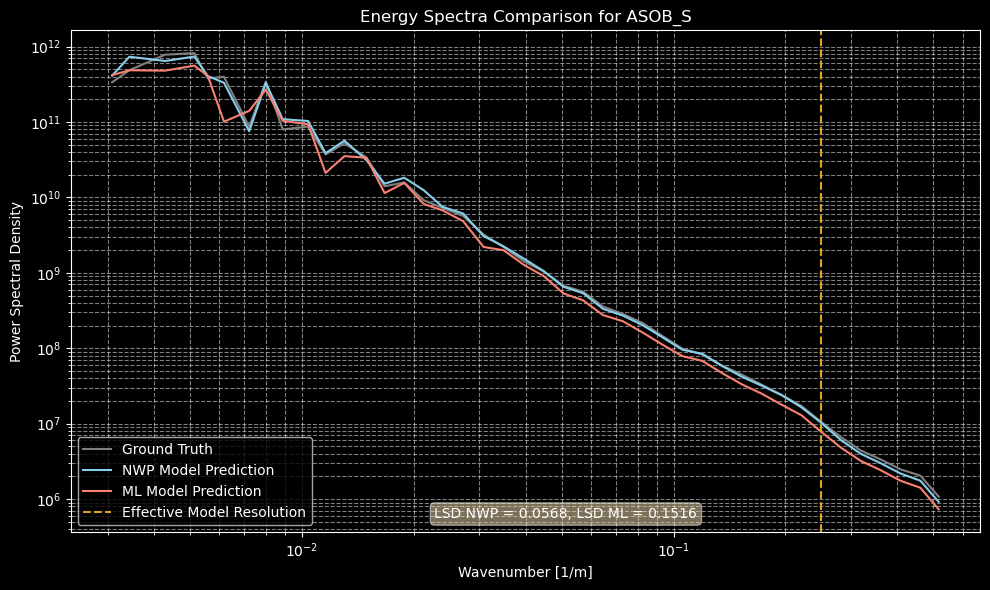

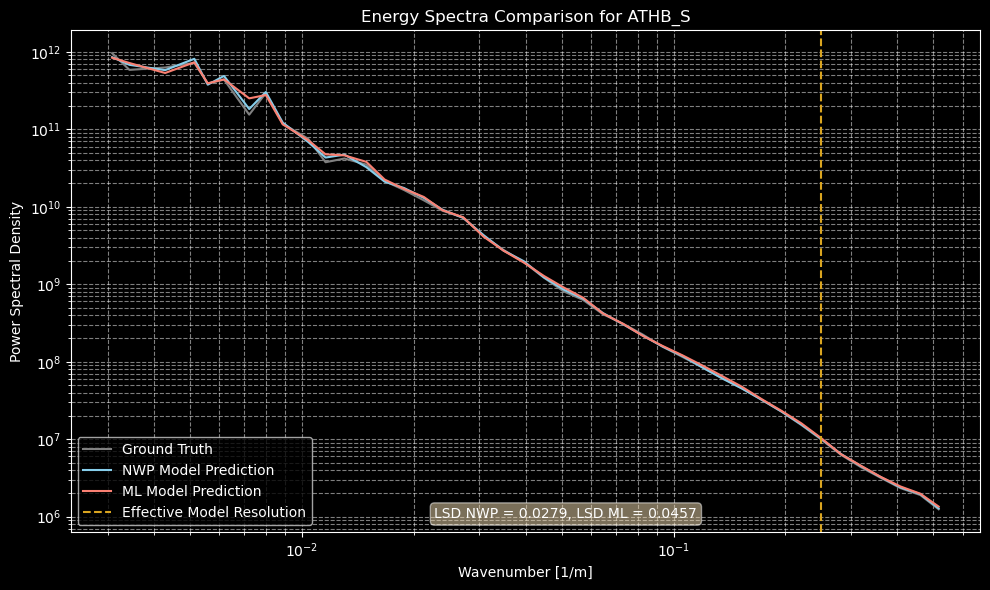

In [22]:
# For 2D variables
for var in VARIABLES_2D:
    fig, ax = plot_energy_spectra(ds_gt, ds_nwp, ds_ml, var)
    plt.show()

### 3D Variables

In [ ]:
# For 3D variables
for var in VARIABLES_3D:
    for level in Z:
        fig, ax = plot_energy_spectra(ds_gt, ds_nwp, ds_ml, var, level=level)
        plt.show()

In [24]:
def display_lsd_table(ds_gt, ds_nwp, ds_ml, variables, levels):
    """
    Display a table with LSD metrics for variables as columns and height as rows.
    Text coloring:
    - Green: LSD < 1 (Good similarity)
    - Orange: 1 ≤ LSD < 2 (Moderate differences)
    - Red: LSD ≥ 2 (Significant differences)
    """
    # Create and populate DataFrame as before
    lsd_data = {var: [] for var in variables}

    for z in sorted(levels):
        for var in variables:
            if var in ds_gt and var in ds_nwp and var in ds_ml:
                var_data = ds_gt[var].sel(z=z)
                var_data_nwp = ds_nwp[var].sel(z=z)
                var_data_ml = ds_ml[var].sel(z=z)

                _, spectrum_gt, _ = calculate_energy_spectra(var_data)
                _, spectrum_nwp, _ = calculate_energy_spectra(var_data_nwp)
                _, spectrum_ml, _ = calculate_energy_spectra(var_data_ml)

                lsd_nwp, lsd_ml = calculate_log_spectral_distance(
                    spectrum_gt, spectrum_nwp, spectrum_ml
                )
                lsd_data[var].append((lsd_nwp, lsd_ml))

    df = pd.DataFrame(lsd_data, index=sorted(levels))
    df.index.name = "Height Level"

    # Define the color styling function
    def color_lsd(val):
        lsd_nwp, lsd_ml = val
        if lsd_nwp < 1 and lsd_ml < 1:
            color = "green"
        elif lsd_nwp < 2 and lsd_ml < 2:
            color = "orange"
        else:
            color = "red"
        return f"color: {color}"

    # Updated formatter for clearer labeling
    def format_tuple(val):
        lsd_nwp, lsd_ml = val
        return f"NWP: {lsd_nwp:.3f}\nML: {lsd_ml:.3f}"

    # Apply styling and display with custom formatter
    styled_df = df.style.format(format_tuple).map(color_lsd)

    display(styled_df)


display_lsd_table(ds_gt, ds_nwp, ds_ml, VARIABLES_3D, Z)

,U,V,PP,T,RELHUM,W
Height Level,,,,,,
6,NWP: 0.034 ML: 0.100,NWP: 0.036 ML: 0.050,NWP: 0.042 ML: 0.030,NWP: 0.038 ML: 0.066,NWP: 0.027 ML: 0.098,NWP: 0.060 ML: 0.079
12,NWP: 0.053 ML: 0.081,NWP: 0.035 ML: 0.080,NWP: 0.021 ML: 0.024,NWP: 0.041 ML: 0.093,NWP: 0.037 ML: 0.070,NWP: 0.056 ML: 0.061
20,NWP: 0.039 ML: 0.097,NWP: 0.034 ML: 0.087,NWP: 0.017 ML: 0.039,NWP: 0.024 ML: 0.062,NWP: 0.030 ML: 0.084,NWP: 0.043 ML: 0.038
27,NWP: 0.046 ML: 0.078,NWP: 0.029 ML: 0.042,NWP: 0.011 ML: 0.026,NWP: 0.017 ML: 0.028,NWP: 0.023 ML: 0.066,NWP: 0.047 ML: 0.061
31,NWP: 0.026 ML: 0.059,NWP: 0.024 ML: 0.047,NWP: 0.009 ML: 0.016,NWP: 0.008 ML: 0.017,NWP: 0.029 ML: 0.044,NWP: 0.043 ML: 0.066
39,NWP: 0.020 ML: 0.043,NWP: 0.024 ML: 0.053,NWP: 0.006 ML: 0.013,NWP: 0.010 ML: 0.014,NWP: 0.018 ML: 0.046,NWP: 0.039 ML: 0.080
45,NWP: 0.017 ML: 0.042,NWP: 0.023 ML: 0.045,NWP: 0.005 ML: 0.010,NWP: 0.008 ML: 0.018,NWP: 0.025 ML: 0.049,NWP: 0.035 ML: 0.069
60,NWP: 0.017 ML: 0.059,NWP: 0.019 ML: 0.044,NWP: 0.005 ML: 0.009,NWP: 0.005 ML: 0.009,NWP: 0.023 ML: 0.045,NWP: 0.029 ML: 0.058


### 5. Vertical Profiles

In this chapter, the focus is on assessing how the relative error between the ML
model and ERA5 data varies with altitude across different latitude bands.
Vertical profiles are essential for understanding the atmospheric structure and
processes at different pressure levels. Obviously these plots only work for 3D
variables.

**Relative Error Calculation:** Using percentage differences provides a
normalized measure of error that is comparable across variables and pressure
levels.

**Latitude Band Analysis:** As with previous chapters, examining different
latitude bands acknowledges the variability in atmospheric conditions around the
globe.

**Altitude-Specific Insights:** The plots reveal whether the ML model performs
consistently across different altitudes or if certain layers pose challenges.

**Atmospheric Dynamics:** Accurate representation of vertical profiles is
crucial for modeling phenomena like convection or the jet stream.

**Pressure Level Interpretation:** Lower pressure levels correspond to higher
altitudes. Inverted axes help represent this correctly but can be
counterintuitive.

[-4.4494712e-01  1.0703841e+00 -1.0601321e+01 -1.0522887e+01
  8.8133682e+03  9.1982870e+00 -8.8686226e+01 -1.0863147e+02]
[-6.5076042e+01 -1.2013478e+03 -1.9278301e+00  4.4726147e+03
 -1.6768860e+01 -2.6924381e+01 -2.2365740e+01 -4.2957218e+01]
[-5.733612   -1.9664552   7.742428   22.474136   -0.16457672 21.211622
 -7.1727357  -1.6170623 ]
[-0.06221242 -0.09422005  0.10801502  0.04749706  0.00178738 -0.00790114
  0.03418021  0.00072517]
[3.2392025e+00 6.5941963e+03 1.2082996e+07 4.4736368e+07 1.1864459e+07
 6.7775600e+05 5.0858680e+04 9.4063364e-02]
[-335.41724  -151.25854   -60.19247   301.15295   -58.938034 -176.57353
  -70.96426   -10.277271]


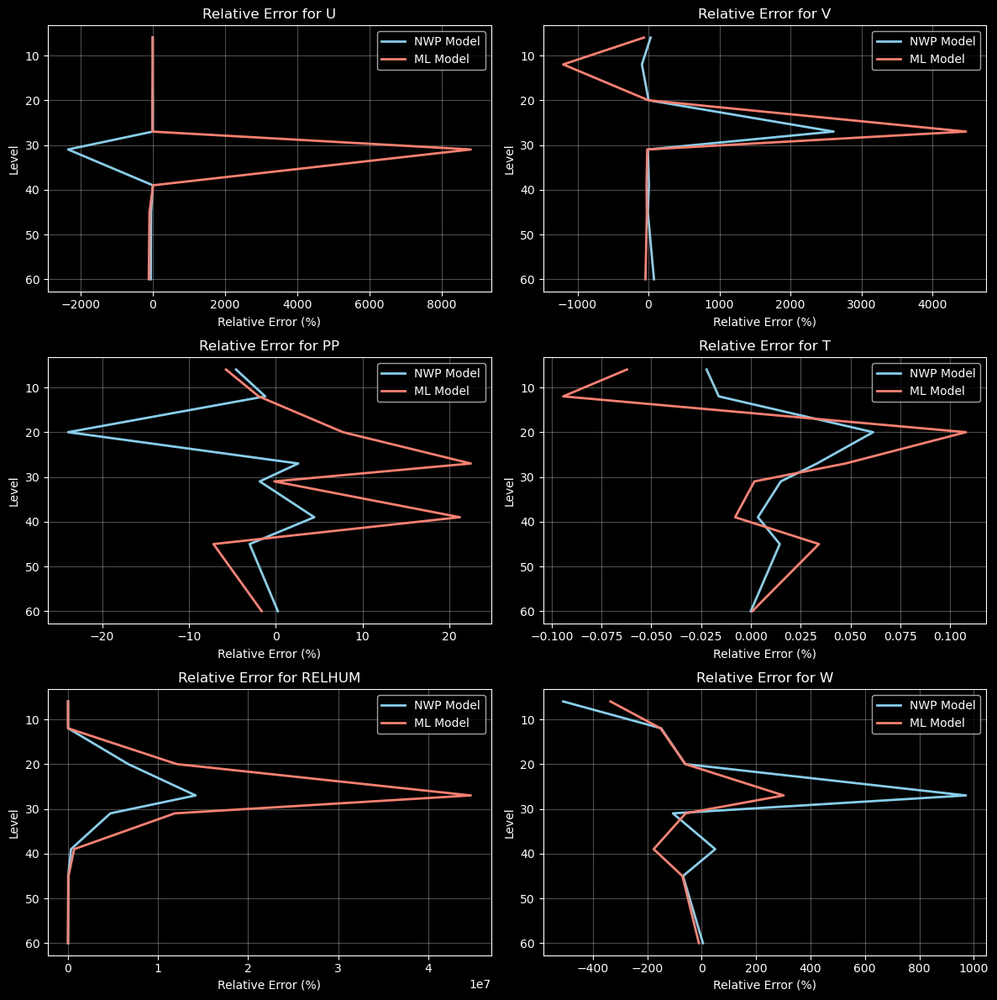

In [ ]:
def plot_vertical_errors_multigrid(ds_gt, ds_nwp, ds_ml, variables, levels):
    """
    Plot vertical profiles of relative error for multiple variables in a grid.
    """
    num_vars = len(variables)
    cols = 2
    rows = (num_vars + 1) // cols

    epsilon = 1e-6  # Small value to avoid division by zero

    fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows), dpi=100)
    axes = axes.flatten()

    for i, var in enumerate(variables):
        # Calculate relative error
        relative_error_nwp = (
            (ds_nwp[var] - ds_gt[var]) / (ds_gt[var] + epsilon)
        ).mean(dim=["time", "y", "x"], skipna=True) * 100
        relative_error_ml = (
            (ds_ml[var] - ds_gt[var]) / (ds_gt[var] + epsilon)
        ).mean(dim=["time", "y", "x"], skipna=True) * 100

        # Plot vertical profile
        axes[i].plot(
            relative_error_nwp,
            levels,
            linewidth=2,
            label="NWP Model",
            color="skyblue",
        )
        axes[i].plot(
            relative_error_ml,
            levels,
            linewidth=2,
            label="ML Model",
            color="salmon",
        )
        axes[i].set_title(f"Relative Error for {var}", size=12)
        axes[i].set_xlabel("Relative Error (%)", size=10)
        axes[i].set_ylabel("Level", size=10)
        axes[i].grid(True, alpha=0.3)
        axes[i].invert_yaxis()
        axes[i].legend()

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


# Usage
plot_vertical_errors_multigrid(ds_gt, ds_nwp, ds_ml, VARIABLES_3D, Z)

### 6. Various Verification Metrics

The final chapter consolidates various statistical metrics to provide a broad
evaluation of the ML model's performance. By considering multiple metrics, we
gain a nuanced understanding of both the strengths and weaknesses of the model.

**Metric Diversity:** Including MAE, RMSE, MSE, Pearson correlation, and the
Fractions Skill Score (FSS) covers different aspects of model performance, from
average errors to spatial pattern accuracy.

**MAE, MSE and RMSE:** Offer insights into the average magnitude of errors, with
RMSE emphasizing larger discrepancies. The colors indicating high errors are
only implemented for these three metrics with standardization.

**Pearson Correlation:** Assesses the linear relationship, indicating whether
the model captures variability even if biases exist.

**FSS:** Evaluates spatial accuracy, which is particularly important for
predicting localized weather events.

**Wasserstein Distance:** Provides a holistic view of distributional similarity
across variables. Same as chapter 3.

**Standardization of Data:** Standardizing variables ensures that metrics are
not dominated by variables with larger magnitudes, allowing for fair
comparisons.

**Holistic Assessment:** The combination of metrics provides a comprehensive
performance profile, essential for model validation and comparison.

In [26]:
max_spatial_dim = max(ds_gt.x.size, ds_gt.y.size)
window_size = (max_spatial_dim // 100,) * 2
n_points = min(10000000, ds_gt[VARIABLES_2D[0]].size)
print(f"Using window size: {window_size}")
print(f"Using n_points: {n_points}")

Using window size: (5, 5)
Using n_points: 2269800


In [27]:
def calculate_all_metrics(ds_gt, ds_nwp, ds_ml, calc_relative=True):
    """Calculate a set of metrics for each variable in the given datasets."""
    variables = list(ds_gt.data_vars)
    metrics_dict = {}

    for var in variables:
        print(f"Calculating metrics for variable: {var}")
        y_true = ds_gt[var].compute()
        y_pred_nwp = ds_nwp[var].compute()
        y_pred_ml = ds_ml[var].compute()

        sample = np.random.choice(
            y_true.values.ravel(), n_points, replace=False
        )
        quantile_90 = np.quantile(sample, 0.90)

        # Calculate norms and mean absolute value
        l1_norm = np.sum(np.abs(y_true.values))
        l2_norm = np.sqrt(np.sum(y_true.values**2))
        mean_abs = np.mean(np.abs(y_true.values))

        # Calculate metrics
        mae_val_nwp = mae(y_true, y_pred_nwp)
        rmse_val_nwp = rmse(y_true, y_pred_nwp)
        mae_val_ml = mae(y_true, y_pred_ml)
        rmse_val_ml = rmse(y_true, y_pred_ml)

        metrics_dict[var] = {
            "MAE NWP": mae_val_nwp,
            "RMSE NWP": rmse_val_nwp,
            "MSE NWP": mse(y_true, y_pred_nwp),
            "MAE ML": mae_val_ml,
            "RMSE ML": rmse_val_ml,
            "MSE ML": mse(y_true, y_pred_ml),
            "Relative MAE NWP": mae_val_nwp / mean_abs,  # Added relative MAE
            "Relative MAE ML": mae_val_ml / mean_abs,  # Added relative MAE
            "Pearson R NWP": pearsonr(y_true, y_pred_nwp),
            "Pearson R ML": pearsonr(y_true, y_pred_ml),
            "FSS NWP": fss_2d(
                y_pred_nwp,
                y_true,
                event_threshold=quantile_90,
                window_size=window_size,
                spatial_dims=["y", "x"],
            ),
            "FSS ML": fss_2d(
                y_pred_ml,
                y_true,
                event_threshold=quantile_90,
                window_size=window_size,
                spatial_dims=["y", "x"],
            ),
            "Wasserstein NWP": wasserstein_distance(
                y_true.values.flatten(), y_pred_nwp.values.flatten()
            ),
            "Wasserstein ML": wasserstein_distance(
                y_true.values.flatten(), y_pred_ml.values.flatten()
            ),
        }

        if calc_relative:
            metrics_dict[var].update({
                "Relative L1 NWP": mae_val_nwp / l1_norm,
                "Relative L2 NWP": rmse_val_nwp / l2_norm,
                "Relative L1 ML": mae_val_ml / l1_norm,
                "Relative L2 ML": rmse_val_ml / l2_norm,
            })

    # Create DataFrame with desired column order
    cols = [
        "MAE NWP",
        "MAE ML",
        "RMSE NWP",
        "RMSE ML",
        "MSE NWP",
        "MSE ML",
        "Relative MAE NWP",
        "Relative MAE ML",
        "Relative L1 NWP",
        "Relative L1 ML",
        "Relative L2 NWP",
        "Relative L2 ML",
        "Pearson R NWP",
        "Pearson R ML",
        "FSS NWP",
        "FSS ML",
    ]

    cols_stdized = [
        "MAE NWP",
        "MAE ML",
        "RMSE NWP",
        "RMSE ML",
        "MSE NWP",
        "MSE ML",
        "Relative MAE NWP",
        "Relative MAE ML",
        "Wasserstein NWP",
        "Wasserstein ML",
    ]

    df = pd.DataFrame.from_dict(metrics_dict, orient="index")
    if calc_relative:
        return df[cols]
    return df[cols_stdized]


# Calculate metrics
regular_metrics = calculate_all_metrics(
    ds_gt, ds_nwp, ds_ml, calc_relative=True
)
standardized_metrics = calculate_all_metrics(
    ds_gt_standardized,
    ds_nwp_standardized,
    ds_ml_standardized,
    calc_relative=False,
)
standardized_metrics.columns = [
    f"{col} (Stdized)" for col in standardized_metrics.columns
]

formatters = {
    "MAE NWP": "{:.4f}",
    "MAE ML": "{:.4f}",
    "RMSE NWP": "{:.4f}",
    "RMSE ML": "{:.4f}",
    "MSE NWP": "{:.4f}",
    "MSE ML": "{:.4f}",
    "Relative MAE NWP": "{:.4f}",
    "Relative MAE ML": "{:.4f}",
    "Relative L1 NWP": "{:.3e}",
    "Relative L1 ML": "{:.3e}",
    "Relative L2 NWP": "{:.3e}",
    "Relative L2 ML": "{:.3e}",
    "Pearson R NWP": "{:.4f}",
    "Pearson R ML": "{:.4f}",
    "FSS NWP": "{:.4f}",
    "FSS ML": "{:.4f}",
    "Wasserstein NWP": "{:.4f}",
    "Wasserstein ML": "{:.4f}",
    # Standardized versions
    "MAE NWP (Stdized)": "{:.4f}",
    "MAE ML (Stdized)": "{:.4f}",
    "RMSE NWP (Stdized)": "{:.4f}",
    "RMSE ML (Stdized)": "{:.4f}",
    "MSE NWP (Stdized)": "{:.4f}",
    "MSE ML (Stdized)": "{:.4f}",
    "Relative MAE NWP (Stdized)": "{:.4f}",
    "Relative MAE ML (Stdized)": "{:.4f}",
    "Wasserstein NWP (Stdized)": "{:.4f}",
    "Wasserstein ML (Stdized)": "{:.4f}",
}
print("Regular Metrics:")
display(regular_metrics.style.format(formatters))
print("\nStandardized Metrics:")
display(standardized_metrics.style.format(formatters))

Calculating metrics for variable: T_2M
Calculating metrics for variable: U_10M
Calculating metrics for variable: V_10M
Calculating metrics for variable: PMSL
Calculating metrics for variable: PS
Calculating metrics for variable: TOT_PREC
Calculating metrics for variable: ASHFL_S
Calculating metrics for variable: ASOB_S
Calculating metrics for variable: ATHB_S
Calculating metrics for variable: U
Calculating metrics for variable: V
Calculating metrics for variable: PP
Calculating metrics for variable: T
Calculating metrics for variable: RELHUM
Calculating metrics for variable: W
Calculating metrics for variable: T_2M
Calculating metrics for variable: U_10M
Calculating metrics for variable: V_10M
Calculating metrics for variable: PMSL
Calculating metrics for variable: PS
Calculating metrics for variable: TOT_PREC
Calculating metrics for variable: ASHFL_S
Calculating metrics for variable: ASOB_S
Calculating metrics for variable: ATHB_S
Calculating metrics for variable: U
Calculating metric

,MAE NWP,MAE ML,RMSE NWP,RMSE ML,MSE NWP,MSE ML,Relative MAE NWP,Relative MAE ML,Relative L1 NWP,Relative L1 ML,Relative L2 NWP,Relative L2 ML,Pearson R NWP,Pearson R ML,FSS NWP,FSS ML
T_2M,0.3778,0.8263,0.5354,1.1192,0.2866,1.2525,0.0014,0.0030,6.008e-10,1.314e-09,1.283e-06,2.681e-06,0.9949,0.9779,0.9734,0.9228
U_10M,0.7788,1.2353,1.1512,1.8284,1.3254,3.3429,0.3627,0.5753,1.598e-07,2.535e-07,2.603e-04,4.134e-04,0.9232,0.8048,0.8792,0.7151
V_10M,0.7537,1.2154,1.0997,1.7693,1.2094,3.1304,0.3290,0.5306,1.450e-07,2.338e-07,2.313e-04,3.721e-04,0.9306,0.8218,0.9139,0.7535
PMSL,56.3228,138.5382,75.1342,183.0036,5645.1528,33490.3008,0.0006,0.0014,2.454e-10,6.036e-10,4.932e-07,1.201e-06,0.9966,0.9817,0.9840,0.9032
PS,49.5883,126.2562,65.9106,166.9898,4344.2051,27885.5840,0.0005,0.0013,2.286e-10,5.820e-10,4.568e-07,1.157e-06,0.9999,0.9997,0.9750,0.9699
TOT_PREC,0.1367,0.2076,0.4075,0.5566,0.1660,0.3098,0.7426,1.1277,3.272e-07,4.968e-07,4.854e-04,6.631e-04,0.6994,0.4113,0.7216,0.4488
ASHFL_S,8.7279,16.9421,14.8916,26.4572,221.7583,699.9834,0.3529,0.6850,1.555e-07,3.018e-07,2.657e-04,4.721e-04,0.9159,0.7323,0.8727,0.6942
ASOB_S,10.6908,28.7913,22.4808,55.6192,505.3860,3093.4985,0.4055,1.0922,1.787e-07,4.812e-07,2.488e-04,6.155e-04,0.9111,0.3738,0.7984,0.2226
ATHB_S,9.0584,17.9799,14.9702,26.7431,224.1062,715.1909,0.2637,0.5234,1.162e-07,2.306e-07,2.116e-04,3.779e-04,0.8929,0.6647,0.8512,0.6299
U,1.4788,2.5338,2.1384,3.5766,4.5726,12.7923,0.0977,0.1675,5.382e-09,9.222e-09,2.557e-05,4.276e-05,0.9863,0.9622,0.9202,0.8566



Standardized Metrics:


,MAE NWP (Stdized),MAE ML (Stdized),RMSE NWP (Stdized),RMSE ML (Stdized),MSE NWP (Stdized),MSE ML (Stdized),Relative MAE NWP (Stdized),Relative MAE ML (Stdized),Wasserstein NWP (Stdized),Wasserstein ML (Stdized)
T_2M,0.0709,0.1550,0.1005,0.2101,0.0101,0.0441,0.0866,0.1894,0.0078,0.0152
U_10M,0.2655,0.4212,0.3925,0.6234,0.1541,0.3886,0.3625,0.5751,0.0084,0.0459
V_10M,0.2538,0.4094,0.3704,0.5958,0.1372,0.3550,0.3580,0.5775,0.0158,0.0290
PMSL,0.0662,0.1629,0.0884,0.2152,0.0078,0.0463,0.0814,0.2004,0.0331,0.1025
PS,0.0084,0.0214,0.0111,0.0282,0.0001,0.0008,0.0116,0.0296,0.0045,0.0137
TOT_PREC,0.2644,0.4015,0.7879,1.0763,0.6208,1.1585,0.4872,0.7398,0.0063,0.0328
ASHFL_S,0.2406,0.4671,0.4103,0.7292,0.1684,0.5317,0.3607,0.7004,0.0173,0.0412
ASOB_S,0.2141,0.5766,0.4503,1.1139,0.2028,1.2407,0.2928,0.7885,0.0736,0.0869
ATHB_S,0.2775,0.5509,0.4587,0.8193,0.2104,0.6713,0.3286,0.6522,0.0075,0.0289
U,0.1128,0.1931,0.1623,0.2700,0.0263,0.0729,0.1412,0.2416,0.0109,0.0311


### Equitable Skill Score
Range: -1/3 to 1, where:
- 1 = perfect score
- 0 = no skill compared to random chance
- Negative values = worse than random chance

**Key Properties:**
- ETS measures how well predicted events correspond to observed events, accounting for hits due to random chance
- It's particularly useful for rare events (like precipitation above a high threshold)
- It's more equitable than the simple Threat Score because it accounts for hits that would occur by chance

**Advantages:**
- More meaningful than simple accuracy for rare events
- Penalizes both misses and false alarms
- Accounts for random chance, making it more robust than basic threat scores

In [32]:
def calculate_ets_for_thresholds(ds_gt, ds_nwp, ds_ml, thresholds):
    """Calculate ETS metrics for each variable and threshold in the given datasets."""
    variables = list(ds_gt.data_vars)
    metrics_dict_nwp = {}
    metrics_dict_ml = {}

    for var in variables:
        y_true = ds_gt[var]
        y_pred_nwp = ds_nwp[var]
        y_pred_ml = ds_ml[var]

        metrics_dict_nwp[var] = {}
        metrics_dict_ml[var] = {}

        for threshold in thresholds:
            quantile = np.quantile(y_true, threshold / 100.0)

            # Create binary events
            obs_events = y_true >= quantile
            fcst_events_nwp = y_pred_nwp >= quantile
            fcst_events_ml = y_pred_ml >= quantile

            # Create binary contingency managers
            bcm_nwp = BinaryContingencyManager(
                fcst_events=fcst_events_nwp, obs_events=obs_events
            )
            bcm_ml = BinaryContingencyManager(
                fcst_events=fcst_events_ml, obs_events=obs_events
            )

            # Transform to get basic contingency manager
            basic_cm_nwp = bcm_nwp.transform(reduce_dims="all")
            basic_cm_ml = bcm_ml.transform(reduce_dims="all")

            # Calculate ETS
            ets_score_nwp = basic_cm_nwp.equitable_threat_score()
            ets_score_ml = basic_cm_ml.equitable_threat_score()

            metrics_dict_nwp[var][f"{threshold}%"] = float(ets_score_nwp.values)
            metrics_dict_ml[var][f"{threshold}%"] = float(ets_score_ml.values)

    # Create separate DataFrames
    df_nwp = pd.DataFrame.from_dict(metrics_dict_nwp, orient="index")
    df_ml = pd.DataFrame.from_dict(metrics_dict_ml, orient="index")

    # Define formatters
    formatters = {f"{threshold}%": "{:.4f}" for threshold in thresholds}

    def color_skill_level(val):
        score = float(val)
        if score >= 0.7:
            color = "green"
        elif score >= 0.5:
            color = "blue"
        elif score >= 0.3:
            color = "orange"
        else:
            color = "red"
        return f"color: {color}"

    print("\nNWP Equitable Threat Score Metrics:")
    display(df_nwp.style.format(formatters).map(color_skill_level))

    print("\nML Equitable Threat Score Metrics:")
    display(df_ml.style.format(formatters).map(color_skill_level))

    return df_nwp, df_ml


# Define thresholds
thresholds = [50, 60, 70, 80, 90]

# Calculate and display metrics
nwp_metrics, ml_metrics = calculate_ets_for_thresholds(
    ds_gt, ds_nwp, ds_ml, thresholds
)


NWP Equitable Threat Score Metrics:


,50%,60%,70%,80%,90%
T_2M,0.8978,0.8946,0.8812,0.8846,0.8853
U_10M,0.5485,0.5586,0.6058,0.6592,0.6295
V_10M,0.6172,0.6442,0.6557,0.6761,0.6893
PMSL,0.8624,0.9146,0.9333,0.9380,0.9451
PS,0.9789,0.9737,0.9706,0.9846,0.9258
TOT_PREC,nan,0.6745,0.6413,0.5585,0.4439
ASHFL_S,0.6393,0.6249,0.6055,0.5639,0.5320
ASOB_S,nan,nan,0.6338,0.5469,0.5808
ATHB_S,0.6273,0.6159,0.5989,0.5836,0.5729
U,0.8204,0.8231,0.8147,0.8373,0.8062



ML Equitable Threat Score Metrics:


,50%,60%,70%,80%,90%
T_2M,0.7756,0.7487,0.7361,0.7577,0.7788
U_10M,0.3964,0.4093,0.4510,0.4846,0.4297
V_10M,0.4698,0.4937,0.5048,0.5100,0.4673
PMSL,0.7824,0.7944,0.8480,0.7947,0.7803
PS,0.9470,0.9310,0.9276,0.9625,0.9036
TOT_PREC,nan,0.3785,0.3487,0.2873,0.2058
ASHFL_S,0.3836,0.3732,0.3701,0.3493,0.3279
ASOB_S,nan,nan,0.3493,0.1690,0.0729
ATHB_S,0.3777,0.3632,0.3490,0.3408,0.3267
U,0.7280,0.7151,0.6877,0.7365,0.7016


Combined SAL = |S| + |A| + |L|
- Range: [0 to 6]
- 0: Perfect forecast
- Higher values indicate worse forecasts

1. Structure (S): [-2 to +2]
- Measures how well the spatial patterns match
- S = 0: Perfect structural agreement
- S > 0: Predicted patterns too large/flat
- S < 0: Predicted patterns too peaked/small

2. Amplitude (A): [-2 to +2]
- Measures the accuracy of domain-averaged values
- A = 0: Perfect amplitude match
- A > 0: Overestimation
- A < 0: Underestimation

3. Location (L): [0 to +2]
- Measures the accuracy of spatial placement
- L = 0: Perfect location match
- L increases with distance between predicted and observed centers of mass

SAL works best for:
- Fields with distinct objects/features
- Variables that can form coherent structures
- Fields with clear boundaries/gradients

In [ ]:
def calculate_sal(ds_gt, ds_nwp, ds_ml, thr_factor=0.067, thr_quantile=0.9):
    """Calculate SAL metrics for each variable and level in the given datasets."""
    sal_dict = {}
    VARIABLES_2D_SAL = ["TOT_PREC"]

    for var in VARIABLES_2D_SAL:
        if var not in ds_gt or var not in ds_nwp or var not in ds_ml:
            continue

        structure_scores_nwp = []
        amplitude_scores_nwp = []
        location_scores_nwp = []
        structure_scores_ml = []
        amplitude_scores_ml = []
        location_scores_ml = []

        for t in range(len(ds_gt.time)):
            y_true = ds_gt[var].isel(time=t).values
            y_pred_nwp = ds_nwp[var].isel(time=t).values
            y_pred_ml = ds_ml[var].isel(time=t).values

            try:
                sal_score_nwp = sal(
                    y_pred_nwp,
                    y_true,
                    thr_factor=thr_factor,
                    thr_quantile=thr_quantile,
                )
                sal_score_ml = sal(
                    y_pred_ml,
                    y_true,
                    thr_factor=thr_factor,
                    thr_quantile=thr_quantile,
                )
                structure_scores_nwp.append(sal_score_nwp[0])
                amplitude_scores_nwp.append(sal_score_nwp[1])
                location_scores_nwp.append(sal_score_nwp[2])
                structure_scores_ml.append(sal_score_ml[0])
                amplitude_scores_ml.append(sal_score_ml[1])
                location_scores_ml.append(sal_score_ml[2])
            except Exception as e:
                print(f"Error calculating SAL for {var} at time {t}: {str(e)}")
                continue

        if structure_scores_nwp and structure_scores_ml:
            structure_mean_nwp = np.nanmean(structure_scores_nwp)
            amplitude_mean_nwp = np.nanmean(amplitude_scores_nwp)
            location_mean_nwp = np.nanmean(location_scores_nwp)
            combined_mean_nwp = (
                np.abs(structure_mean_nwp)
                + np.abs(amplitude_mean_nwp)
                + np.abs(location_mean_nwp)
            )

            structure_mean_ml = np.nanmean(structure_scores_ml)
            amplitude_mean_ml = np.nanmean(amplitude_scores_ml)
            location_mean_ml = np.nanmean(location_scores_ml)
            combined_mean_ml = (
                np.abs(structure_mean_ml)
                + np.abs(amplitude_mean_ml)
                + np.abs(location_mean_ml)
            )

            sal_dict[var] = {
                "Structure": {
                    "NWP": structure_mean_nwp,
                    "ML": structure_mean_ml,
                },
                "Amplitude": {
                    "NWP": amplitude_mean_nwp,
                    "ML": amplitude_mean_ml,
                },
                "Location": {"NWP": location_mean_nwp, "ML": location_mean_ml},
                "Combined": {"NWP": combined_mean_nwp, "ML": combined_mean_ml},
            }

    # Create multi-level DataFrame
    df_dict = {}
    for var in sal_dict:
        for metric in sal_dict[var]:
            df_dict[(var, metric, "NWP")] = sal_dict[var][metric]["NWP"]
            df_dict[(var, metric, "ML")] = sal_dict[var][metric]["ML"]

    df = pd.DataFrame(df_dict, index=["Value"]).T
    df = df.unstack(level=2)
    df.columns = df.columns.droplevel(0)  # Remove 'Value' level

    formatters = {col: "{:.4f}" for col in df.columns}

    return df.style.format(formatters)


sal_metrics = calculate_sal(ds_gt, ds_nwp, ds_ml)
display(sal_metrics)